# Branch-level TDABM analysis

Branch-level TDABM constructs a graph from the host-area census characteristics of Open/Closed records. Broad feature definitions match the area analysis, while observations and outcomes refer to branches. Membership exports and two robustness checks follow the main graph. Run after the matching notebook.

## Notebook guide

Each block describes its inputs, workflow and outputs. Function notes cover parameters, logic and returns.


## Package load

**Inputs:** Processed branch CSV from the matching notebook and scientific packages, including `pyballmapper` and scikit-learn.

**Steps:**

1. Import numerical, table, plotting and graph libraries, and configure notebook display defaults.
2. Resolve input/output paths, stop if the processed file is missing, and create figures and TDABM table directories.
3. Set the rainbow palette and `SEED=42`; print the imported pyballmapper module and output location.

**Outputs:** `FIG_DIR`, `TABLE_DIR`, `SEED`, plotting defaults and imported libraries used throughout.


In [1]:
# Optional installation:
# !pip install pyballmapper numpy pandas matplotlib seaborn scikit-learn networkx

from pathlib import Path
import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx
import pyballmapper as pbm

from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import NearestNeighbors

pd.set_option("display.max_columns", 160)
pd.set_option("display.max_rows", 120)
sns.set_style("whitegrid")
plt.rcParams.update({"figure.dpi": 100, "font.size": 11})

HERE = Path.cwd().resolve()
PROJECT_ROOT = HERE.parent if HERE.name == "notebooks" else HERE
DATA_DIR = PROJECT_ROOT / "data" / "processed"
BANK_FILE = DATA_DIR / "eda_bank_level.csv"
if not BANK_FILE.exists():
    raise FileNotFoundError("Run data_matching_procedure.ipynb first to create eda_bank_level.csv.")
OUTPUT_DIR = PROJECT_ROOT / "results"
FIG_DIR = OUTPUT_DIR / "figures"
TABLE_DIR = OUTPUT_DIR / "tdabm_tables"
for folder in [OUTPUT_DIR, FIG_DIR, TABLE_DIR]:
    folder.mkdir(parents=True, exist_ok=True)

hsvp = plt.cm.get_cmap("gist_rainbow")
SEED = 42
np.random.seed(SEED)

print("pyballmapper:", pbm)
print("Current folder:", HERE)
print("Output folder:", OUTPUT_DIR)


pyballmapper: <module 'pyballmapper' from 'D:\\anaconda\\Lib\\site-packages\\pyballmapper\\__init__.py'>
Current folder: C:\Users\liwen\Documents\ERP Topological data science\材料提交\Additional_Materials_Submission\notebooks
Output folder: C:\Users\liwen\Documents\ERP Topological data science\材料提交\Additional_Materials_Submission\results


## Data and helper functions

**Inputs:** Harmonised census counts and individual branch status records.

**Steps:**

1. Define the ratio, census-feature, membership, construction, summary and drawing helpers described below.
2. Read the source CSV and derive broad census shares plus detailed components for later robustness checks.
3. Retain Open and Closed records, map Closed=1/Open=0, construct the complementary open indicator and check that the outcome columns refer to branch status.
4. Define 30 unique distance coordinates in `BM_FEATURES`, assert the outcome is excluded, and keep both outcome colours plus the feature colours.
5. Deduplicate requested column names, replace infinities with missing values, drop rows missing any main feature or the outcome, and reset positional indices.

**Outputs:** `df` holds the outcome-eligible records with detailed features. `model` is the complete-main-feature sample. `ID_COL`, `SPLIT_VAR`, `STRATA`, `COLOR_VARS` and helper functions govern subsequent analysis.

`STRATA` reports sample composition, and the current configuration uses all eligible observations. Complete-case filtering covers the main features and outcome; auxiliary display variables can retain missing values. Node-size settings are read when the drawing function is called.

**Denominators.** Columns ending in `_pct` store proportions from 0 to 1 for valid nonnegative counts. Display tables convert selected shares to percentages.

| Theme | Denominator | Main grouping logic |
|---|---|---|
| Age | `population_total` | Ages 25-34, 35-49 and 50-64 are pooled into 25-64. |
| Deprivation | `households_total` | No dimensions, one dimension, and the prepared two-or-more group. |
| Car availability | `car_households_total` | Two cars and three-or-more cars form the two-or-more group. |
| Health | `health_total` | `health_other_pct` includes fair, bad and very bad health; `health_bad_very_bad_pct` excludes fair health. |
| Disability | `disability_total` | Disabled counts use the harmonised national category. |
| Qualifications | `education_total_16_plus` | Broad low, middle and higher qualification groups use the cross-national mapping in the matching notebook. |
| NS-SeC | `nssec_total_16_plus` | Managerial/professional plus small employers, and intermediate plus lower-supervisory groups, are pooled. |
| Economic activity | `economic_activity_total_16_plus` | Employment includes employees and the self-employed. Other inactivity combines students, home/family and other inactivity. |
| Industry | `industry_total_with_code` | Production pools agriculture/energy/water, manufacturing and construction; distribution/transport and public/other services are also pooled. |

### Description of functions

#### Function: `safe_divide(numerator, denominator)`

**Aim:** Calculate census shares.

**Parameters:** Aligned numerator and denominator vectors.

**Internal logic:** Coerce to numeric; mask nonpositive denominators.

**Returns and effects:** NumPy proportions; invalid values become `NaN`. Division before masking may warn.

#### Function: `add_census_rates(df)`

**Aim:** Prepare census indicators.

**Parameters:** Harmonised count DataFrame `df`.

**Internal logic:** Copy data, pool counts and apply the listed denominators.

**Returns and effects:** Original columns plus shares; TDABM also prepares expanded features.

#### Function: `get_numeric_series(df, col)`

**Aim:** Read a colouring variable.

**Parameters:** Observation table `df` and column `col`.

**Internal logic:** Select the first duplicate-labelled column and coerce values.

**Returns and effects:** Numeric Series; invalid entries remain missing.

#### Function: `points_and_balls_df(bm)`

**Aim:** Standardise graph memberships.

**Parameters:** BallMapper object `bm`.

**Internal logic:** Recognise package labels, convert identifiers and drop missing pairs.

**Returns and effects:** Integer `point`/`ball` table; point positions, overlaps and duplicate pairs are retained.

#### Function: `ball_sizes_from_pbm(bm)`

**Aim:** Count ball memberships.

**Parameters:** BallMapper object `bm`.

**Internal logic:** Group normalised memberships by ball.

**Returns and effects:** Count Series; overlaps can make total memberships exceed N.

#### Function: `ball_means_from_pbm(df_bm, bm, color_var)`

**Aim:** Summarise ball colours and sizes.

**Parameters:** `df_bm` aligned with `bm`; `color_var` selects values.

**Internal logic:** Join by row position; average nonmissing values and count memberships.

**Returns and effects:** `(means, sizes, merged)`. Binary means are shares; missing colours still count toward size.

#### Function: `build_pbm(X, eps, color_series=None, color_name='color')`

**Aim:** Construct a reproducible cover.

**Parameters:** Scaled `X`, radius `eps`, optional aligned colours.

**Internal logic:** Permute landmarks using `SEED`; construct from `X`, then summarise colours.

**Returns and effects:** BallMapper object with `.Graph`; fixed row count and seed reproduce candidate order.

#### Function: `bm_stats_pbm(X, eps)`

**Aim:** Summarise graph resolution.

**Parameters:** Scaled `X` and radius `eps`.

**Internal logic:** Build the graph and count nodes, edges, components and memberships.

**Returns and effects:** Statistics dictionary; `avg_overlaps` is memberships divided by N.

#### Function: `draw_pbm_custom(df_bm, X, eps, color_var, colorbar_label, filename, pos=None, bm=None)`

**Aim:** Draw and export a graph.

**Parameters:** Aligned data, radius, colour/label/filename; optional `bm` and `pos`.

**Internal logic:** Clip colours at ball-mean percentiles 2/98; scale membership marker areas within each graph.

**Returns and effects:** `(bm, pos)`, displayed figure and `FIG_DIR` PNG. Saved means stay unchanged; missing means use the low colour. Spring positions show graph structure.


In [2]:
def safe_divide(numerator, denominator):
    """Return a numeric ratio while treating zero denominators as missing."""
    numerator = pd.to_numeric(numerator, errors="coerce")
    denominator = pd.to_numeric(denominator, errors="coerce")
    return np.where(denominator > 0, numerator / denominator, np.nan)


def add_census_rates(df):
    """Create Rudkin-inspired broad percentage categories for the TDABM point cloud."""
    out = df.copy()

    out["age_0_15_pct"] = safe_divide(out["age_0_15"], out["population_total"])
    out["age_16_24_pct"] = safe_divide(out["age_16_24"], out["population_total"])
    out["age_25_64_pct"] = safe_divide(
        out[["age_25_34", "age_35_49", "age_50_64"]].sum(axis=1), out["population_total"]
    )
    out["age_65_plus_pct"] = safe_divide(out["age_65_plus"], out["population_total"])

    household_den = out["households_total"]
    for col in ["deprived_0", "deprived_1", "deprived_2_plus"]:
        out[f"{col}_pct"] = safe_divide(out[col], household_den)
    car_den = out["car_households_total"]
    out["cars_0_pct"] = safe_divide(out["cars_0"], car_den)
    out["cars_1_pct"] = safe_divide(out["cars_1"], car_den)
    out["cars_2_plus_pct"] = safe_divide(out["cars_2"] + out["cars_3_plus"], car_den)

    health_den = out["health_total"]
    out["health_very_good_pct"] = safe_divide(out["health_very_good"], health_den)
    out["health_good_pct"] = safe_divide(out["health_good"], health_den)
    out["health_other_pct"] = safe_divide(
        out[["health_fair", "health_bad", "health_very_bad"]].sum(axis=1), health_den
    )
    out["health_bad_very_bad_pct"] = safe_divide(out["health_bad"] + out["health_very_bad"], health_den)
    out["disabled_pct"] = safe_divide(out["disabled"], out["disability_total"])

    education_den = out["education_total_16_plus"]
    out["education_no_qualifications_pct"] = safe_divide(out["education_no_qualifications"], education_den)
    for col in ["education_low", "education_middle", "education_higher"]:
        out[f"{col}_pct"] = safe_divide(out[col], education_den)

    ns_den = out["nssec_total_16_plus"]
    out["nssec_managerial_professional_small_employers_pct"] = safe_divide(
        out["nssec_managerial_professional"] + out["nssec_small_employers_own_account"], ns_den
    )
    out["nssec_intermediate_lower_supervisory_pct"] = safe_divide(
        out["nssec_intermediate"] + out["nssec_lower_supervisory_technical"], ns_den
    )
    out["nssec_semi_routine_routine_pct"] = safe_divide(out["nssec_semi_routine_routine"], ns_den)
    out["nssec_never_worked_long_term_unemployed_pct"] = safe_divide(out["nssec_never_worked_long_term_unemployed"], ns_den)

    econ_den = out["economic_activity_total_16_plus"]
    out["employed_total_pct"] = safe_divide(out[[
        "employee_part_time", "employee_full_time",
        "self_employed_part_time", "self_employed_full_time",
    ]].sum(axis=1), econ_den)
    out["unemployed_pct"] = safe_divide(out["unemployed"], econ_den)
    out["inactive_retired_pct"] = safe_divide(out["inactive_retired"], econ_den)
    out["inactive_long_term_sick_disabled_pct"] = safe_divide(out["inactive_long_term_sick_disabled"], econ_den)
    out["inactive_other_total_pct"] = safe_divide(out[[
        "inactive_student", "inactive_home_family", "inactive_other",
    ]].sum(axis=1), econ_den)

    industry_den = out["industry_total_with_code"]
    out["industry_production_pct"] = safe_divide(out[[
        "industry_agriculture_energy_water", "industry_manufacturing", "industry_construction",
    ]].sum(axis=1), industry_den)
    out["industry_distribution_transport_pct"] = safe_divide(out[[
        "industry_distribution_hotels_restaurants", "industry_transport_communication",
    ]].sum(axis=1), industry_den)
    out["industry_finance_real_estate_professional_admin_pct"] = safe_divide(
        out["industry_finance_real_estate_professional_admin"], industry_den
    )
    out["industry_public_other_services_pct"] = safe_divide(out[[
        "industry_public_admin_education_health", "industry_other",
    ]].sum(axis=1), industry_den)

    # Detailed components are used only by the expanded-variable robustness check.
    for col in ["age_25_34", "age_35_49", "age_50_64"]:
        out[f"{col}_pct"] = safe_divide(out[col], out["population_total"])
    out["cars_2_pct"] = safe_divide(out["cars_2"], car_den)
    out["cars_3_plus_pct"] = safe_divide(out["cars_3_plus"], car_den)
    for col in ["health_fair", "health_bad", "health_very_bad"]:
        out[f"{col}_pct"] = safe_divide(out[col], health_den)
    out["education_apprenticeship_pct"] = safe_divide(
        out["education_apprenticeship"], education_den
    )
    out["education_l1_only_pct"] = (
        out["education_low_pct"] - out["education_no_qualifications_pct"]
    ).clip(lower=0)
    out["education_l2_only_pct"] = (
        out["education_middle_pct"] - out["education_apprenticeship_pct"]
    ).clip(lower=0)
    for col in [
        "nssec_managerial_professional", "nssec_intermediate",
        "nssec_small_employers_own_account", "nssec_lower_supervisory_technical",
        "nssec_full_time_students",
    ]:
        out[f"{col}_pct"] = safe_divide(out[col], ns_den)
    for col in [
        "employee_part_time", "employee_full_time", "self_employed_part_time",
        "self_employed_full_time", "inactive_student", "inactive_home_family", "inactive_other",
    ]:
        out[f"{col}_pct"] = safe_divide(out[col], econ_den)
    for col in [
        "industry_agriculture_energy_water", "industry_manufacturing",
        "industry_construction", "industry_distribution_hotels_restaurants",
        "industry_transport_communication", "industry_public_admin_education_health",
        "industry_other",
    ]:
        out[f"{col}_pct"] = safe_divide(out[col], industry_den)
    return out


def get_numeric_series(df, col):
    """Coerce one display variable to numeric and fill only for graph colouring."""
    values = df.loc[:, col]
    if isinstance(values, pd.DataFrame):
        values = values.iloc[:, 0]
    return pd.to_numeric(values, errors="coerce")


def points_and_balls_df(bm):
    """Return the many-to-many observation/ball membership table from pyballmapper."""
    """Return pyballmapper membership table with exactly two columns: point, ball."""
    pb = bm.points_and_balls()
    if not isinstance(pb, pd.DataFrame):
        pb = pd.DataFrame(pb)

    rename = {}
    for c in pb.columns:
        lc = str(c).lower()
        if lc in ["point", "points", "data_point", "index"]:
            rename[c] = "point"
        if lc in ["ball", "balls", "landmark"]:
            rename[c] = "ball"
    pb = pb.rename(columns=rename)

    point_cols = [c for c in pb.columns if c == "point"]
    ball_cols = [c for c in pb.columns if c == "ball"]
    if not point_cols or not ball_cols:
        raise ValueError(f"Unexpected points_and_balls() columns: {pb.columns.tolist()}")

    # Use .iloc so duplicate column names cannot produce a DataFrame later.
    point_pos = list(pb.columns).index(point_cols[0])
    ball_pos = list(pb.columns).index(ball_cols[0])
    out = pd.DataFrame({
        "point": pd.to_numeric(pb.iloc[:, point_pos], errors="coerce").astype("Int64"),
        "ball": pd.to_numeric(pb.iloc[:, ball_pos], errors="coerce").astype("Int64"),
    }).dropna()
    out["point"] = out["point"].astype(int)
    out["ball"] = out["ball"].astype(int)
    return out


def ball_sizes_from_pbm(bm):
    """Count observation memberships for every Ball Mapper node."""
    pb = points_and_balls_df(bm)
    return pb.groupby("ball", sort=True)["point"].size()


def ball_means_from_pbm(df_bm, bm, color_var):
    """Calculate the displayed variable mean and membership count for each ball."""
    pb = points_and_balls_df(bm).rename(columns={"point": "_point"})
    tmp = pd.DataFrame({
        "_point": np.arange(len(df_bm), dtype=int),
        "_value": get_numeric_series(df_bm, color_var).to_numpy(),
    })
    merged = tmp.merge(pb, on="_point", how="inner")
    means = merged.groupby("ball", sort=True)["_value"].mean()
    sizes = merged.groupby("ball", sort=True)["_point"].size()
    means.name = color_var
    sizes.name = "n_points"
    return means, sizes, merged

def build_pbm(X, eps, color_series=None, color_name="color"):
    """Construct Ball Mapper with the reproducible landmark order set by SEED."""
    landmark_order = np.random.default_rng(SEED).permutation(len(X)).tolist()
    if color_series is None:
        return pbm.BallMapper(X=X, eps=float(eps), order=landmark_order)
    cdf = pd.DataFrame({color_name: pd.to_numeric(color_series, errors="coerce")})
    return pbm.BallMapper(
        X=X, eps=float(eps), order=landmark_order, coloring_df=cdf
    )


def bm_stats_pbm(X, eps):
    """Summarise graph size, connectivity, memberships and overlap at one epsilon."""
    bm = build_pbm(X, eps)
    sizes = ball_sizes_from_pbm(bm)
    return {
        "eps": float(eps),
        "n_balls": bm.Graph.number_of_nodes(),
        "n_edges": bm.Graph.number_of_edges(),
        "n_components": nx.number_connected_components(bm.Graph) if bm.Graph.number_of_nodes() else 0,
        "avg_ball_size": float(sizes.mean()) if len(sizes) else np.nan,
        "max_ball_size": int(sizes.max()) if len(sizes) else 0,
        "avg_overlaps": float(sizes.sum() / len(X)) if len(X) else np.nan,
    }


def draw_pbm_custom(df_bm, X, eps, color_var, colorbar_label, filename, pos=None, bm=None):
    """Recolour one existing Ball Mapper graph and save the publication figure."""
    # Recolour the existing graph without changing membership.
    if bm is None:
        bm = build_pbm(X, eps)
    if pos is None:
        pos = nx.spring_layout(bm.Graph, k=2.5, scale=3.0, seed=SEED)

    means, sizes, _ = ball_means_from_pbm(df_bm, bm, color_var)
    means = pd.to_numeric(means, errors="coerce").dropna()
    if means.empty:
        raise ValueError(f"No numeric values available for coloring variable: {color_var}")

    vmin = float(means.quantile(0.02))
    vmax = float(means.quantile(0.98))
    if pd.isna(vmin) or pd.isna(vmax) or vmin == vmax:
        vmin = float(means.min())
        vmax = float(means.max() + 1e-9)
    norm = plt.Normalize(vmin=vmin, vmax=vmax)

    node_list = list(bm.Graph.nodes())
    node_colours = [hsvp(norm(np.clip(means.get(n, vmin), vmin, vmax))) for n in node_list]

    # Linearly map membership counts to the configured node-area range.
    if NODE_SIZE_MIN <= 0 or NODE_SIZE_MAX <= NODE_SIZE_MIN:
        raise ValueError("Set NODE_SIZE_MIN > 0 and NODE_SIZE_MAX > NODE_SIZE_MIN.")
    raw_memberships = np.array([sizes.get(n, 1) for n in node_list], dtype=float)
    if np.ptp(raw_memberships) == 0:
        node_sizes = np.full(
            len(node_list), (NODE_SIZE_MIN + NODE_SIZE_MAX) / 2.0
        )
    else:
        node_sizes = np.interp(
            raw_memberships,
            [raw_memberships.min(), raw_memberships.max()],
            [float(NODE_SIZE_MIN), float(NODE_SIZE_MAX)],
        )

    fig, ax = plt.subplots(figsize=(16, 12))
    nx.draw_networkx_edges(bm.Graph, pos=pos, ax=ax, edge_color="#999999", width=1.0, alpha=0.6)
    nx.draw_networkx_nodes(
        bm.Graph, pos=pos, ax=ax, nodelist=node_list, node_color=node_colours,
        node_size=node_sizes, alpha=0.88, linewidths=1.0, edgecolors="white"
    )
    large = {n: str(n) for n in node_list if sizes.get(n, 0) >= 200}
    small = {n: str(n) for n in node_list if sizes.get(n, 0) < 200}
    nx.draw_networkx_labels(bm.Graph, pos=pos, ax=ax, labels=large, font_size=11, font_color="black", font_weight="bold")
    nx.draw_networkx_labels(bm.Graph, pos=pos, ax=ax, labels=small, font_size=8, font_color="#555555")

    sm = plt.cm.ScalarMappable(cmap=hsvp, norm=norm)
    sm.set_array([])
    cb = plt.colorbar(sm, ax=ax, shrink=0.65, pad=0.02)
    cb.set_label(colorbar_label, fontsize=16)
    cb.ax.tick_params(labelsize=15)
    ax.set_axis_off()
    plt.tight_layout()
    plt.savefig(FIG_DIR / filename, dpi=150, bbox_inches="tight", facecolor="white")
    plt.show()
    return bm, pos

df = pd.read_csv(BANK_FILE, low_memory=False)
df = add_census_rates(df)
df["country"] = df["country_census"].fillna(df.get("country_bank"))
# Clark et al. (2024) outcome coding: 0 = open, 1 = closed.
df = df.loc[df["status"].isin(["Open", "Closed"])].copy()
df["is_closed"] = df["status"].map({"Open": 0, "Closed": 1}).astype(int)
df["is_open"] = df["status"].map({"Open": 1, "Closed": 0}).astype(int)
assert set(df["status"].unique()) == {"Open", "Closed"}
assert df["is_closed"].isin([0, 1]).all()
assert (df["is_open"] + df["is_closed"] == 1).all()
assert "complete_withdrawal" not in df.columns

# Branch-level data contract: status belongs to an individual premises record.
branch_outcome_audit = (
    df.groupby(["status", "is_closed", "is_open"], observed=True)
    .size().rename("branch_records").reset_index()
)
print("Branch-level outcome audit: individual closed and open records")
display(branch_outcome_audit)

ID_COL = "id"
STRATA = ["country", "status"]
SPLIT_VAR = "is_closed"
BM_FEATURES = [
    # Age structure
    "age_0_15_pct", "age_16_24_pct", "age_25_64_pct", "age_65_plus_pct",
    # Household deprivation and car availability
    "deprived_0_pct", "deprived_1_pct", "deprived_2_plus_pct",
    "cars_0_pct", "cars_1_pct", "cars_2_plus_pct",
    # Self-reported health and disability
    "health_very_good_pct", "health_good_pct", "health_other_pct", "disabled_pct",
    # Qualification groups
    "education_low_pct", "education_middle_pct", "education_higher_pct",
    # NS-SEC groups
    "nssec_managerial_professional_small_employers_pct",
    "nssec_intermediate_lower_supervisory_pct",
    "nssec_semi_routine_routine_pct",
    "nssec_never_worked_long_term_unemployed_pct",
    # Economic activity
    "employed_total_pct", "unemployed_pct", "inactive_retired_pct",
    "inactive_long_term_sick_disabled_pct", "inactive_other_total_pct",
    # Industry structure
    "industry_production_pct", "industry_distribution_transport_pct",
    "industry_finance_real_estate_professional_admin_pct",
    "industry_public_other_services_pct",
]
assert len(BM_FEATURES) == 30 and len(set(BM_FEATURES)) == 30
assert SPLIT_VAR not in BM_FEATURES

# Export closed-record share once; open-record share is its exact complement.
# Every census distance coordinate is exported separately for profile interpretation.
OUTCOME_VARS = ["is_closed", "is_open"]
COLOR_VARS = ["is_closed", "is_open"] + BM_FEATURES
COLOR_LABELS = {
    "is_closed": "Closed-record share",
    "is_open": "Open-record share",
    "age_0_15_pct": "Population aged 0-15 (share)",
    "age_16_24_pct": "Population aged 16-24 (share)",
    "age_25_64_pct": "Population aged 25-64 (share)",
    "age_65_plus_pct": "Population aged 65+ (share)",
    "deprived_0_pct": "Households deprived in no dimensions (share)",
    "deprived_1_pct": "Households deprived in one dimension (share)",
    "deprived_2_plus_pct": "Households deprived in 2+ dimensions (share)",
    "cars_0_pct": "Households with no car or van (share)",
    "cars_1_pct": "Households with one car or van (share)",
    "cars_2_plus_pct": "Households with 2+ cars or vans (share)",
    "health_very_good_pct": "Very good health (share)",
    "health_good_pct": "Good health (share)",
    "health_other_pct": "Fair, bad or very bad health (share)",
    "disabled_pct": "Disabled population (share)",
    "education_low_pct": "Qualification group 1: None + L1 equivalent (share)",
    "education_middle_pct": "Qualification group 2: L2 + apprenticeship equivalent (share)",
    "education_higher_pct": "Qualification group 3: L3 + L4 equivalent (share)",
    "nssec_managerial_professional_small_employers_pct": "Managerial, professional and small-employer NS-SEC (share)",
    "nssec_intermediate_lower_supervisory_pct": "Intermediate and lower-supervisory NS-SEC (share)",
    "nssec_semi_routine_routine_pct": "Semi-routine and routine NS-SEC (share)",
    "nssec_never_worked_long_term_unemployed_pct": "Never worked or long-term unemployed NS-SEC (share)",
    "employed_total_pct": "Employed population aged 16+ (share)",
    "unemployed_pct": "Unemployed population aged 16+ (share)",
    "inactive_retired_pct": "Economically inactive: retired (share)",
    "inactive_long_term_sick_disabled_pct": "Economically inactive: long-term sick or disabled (share)",
    "inactive_other_total_pct": "Other economic inactivity (share)",
    "industry_production_pct": "Production industries (share)",
    "industry_distribution_transport_pct": "Distribution, hospitality and transport industries (share)",
    "industry_finance_real_estate_professional_admin_pct": "Finance, real estate, professional and administrative industries (share)",
    "industry_public_other_services_pct": "Public and other services (share)",
}
AUXILIARY_VARS = ["population_total", "health_bad_very_bad_pct", "education_no_qualifications_pct"]
MAX_N = None

model_cols = list(dict.fromkeys([ID_COL] + STRATA + BM_FEATURES + OUTCOME_VARS + COLOR_VARS + AUXILIARY_VARS))
model = df[model_cols].replace([np.inf, -np.inf], np.nan).dropna(subset=BM_FEATURES + [SPLIT_VAR]).reset_index(drop=True)
print("model shape:", model.shape)
display(model[COLOR_VARS].describe().T)


Branch-level outcome audit: individual closed and open records


,status,is_closed,is_open,branch_records
0,Closed,1,0,6311
1,Open,0,1,5243


model shape: (11554, 38)


,count,mean,std,min,25%,50%,75%,max
is_closed,11554.0,0.546218,0.497881,0.000000,0.000000,1.000000,1.000000,1.000000
is_open,11554.0,0.453782,0.497881,0.000000,0.000000,0.000000,1.000000,1.000000
age_0_15_pct,11554.0,0.145470,0.052781,0.002871,0.114073,0.147341,0.178859,0.400124
age_16_24_pct,11554.0,0.131484,0.119386,0.027778,0.079513,0.094641,0.122169,0.866955
age_25_64_pct,11554.0,0.530861,0.083866,0.083075,0.490746,0.530790,0.577086,0.825080
age_65_plus_pct,11554.0,0.192161,0.098213,0.001764,0.115417,0.188235,0.262317,0.580808
deprived_0_pct,11554.0,0.459960,0.102936,0.165179,0.390884,0.457649,0.531593,0.785016
deprived_1_pct,11554.0,0.340936,0.037903,0.179153,0.319149,0.343339,0.366510,0.468641
deprived_2_plus_pct,11554.0,0.199094,0.082235,0.024775,0.137363,0.187835,0.249558,0.589286
cars_0_pct,11554.0,0.358748,0.178286,0.023656,0.222436,0.326331,0.478315,0.897600


## Descriptive statistics

**Inputs:** `model`, the 30-coordinate definitions and the binary closed branch indicator.

**Steps:**

1. Organise feature labels by census domain and convert shares to percentages for presentation.
2. Compute total-sample mean, sample SD (`ddof=1`), range and group means.
3. Run Welch’s unequal-variance two-sample test for each coordinate; encode markers as *** for p<0.01, ** for p<0.05 and * for p<0.10.
4. Export the compact manuscript table and a more detailed table with count, quartiles, extrema, group means and their difference.

**Outputs:** `manuscript_table_3_branch_tdabm_axes.csv` and `branch_tdabm_descriptive_statistics_and_difference.csv`.


In [3]:
# Manuscript Table 3: branch-level TDABM axes and descriptive statistics.
from scipy.stats import ttest_ind

table_groups = [
    ("Age", [
        ("age_0_15_pct", "Age 0--15"), ("age_16_24_pct", "Age 16--24"),
        ("age_25_64_pct", "Age 25--64"), ("age_65_plus_pct", "Age 65 and over"),
    ]),
    ("Deprivation", [
        ("deprived_0_pct", "Not deprived"),
        ("deprived_1_pct", "Deprived in one dimension"),
        ("deprived_2_plus_pct", "Deprived in two or more dimensions"),
    ]),
    ("Car availability", [
        ("cars_0_pct", "No car or van"), ("cars_1_pct", "One car or van"),
        ("cars_2_plus_pct", "Two or more cars or vans"),
    ]),
    ("Health and disability", [
        ("health_very_good_pct", "Very good health"), ("health_good_pct", "Good health"),
        ("health_other_pct", "Fair, bad or very bad health"),
        ("disabled_pct", "Disabled under the Equality Act"),
    ]),
    ("Qualifications", [
        ("education_low_pct", "Group 1: None + L1 equivalent"),
        ("education_middle_pct", "Group 2: L2 + apprenticeship equivalent"),
        ("education_higher_pct", "Group 3: L3 + L4 equivalent"),
    ]),
    ("NS-SEC", [
        ("nssec_managerial_professional_small_employers_pct", "Managerial, professional and small employers"),
        ("nssec_intermediate_lower_supervisory_pct", "Intermediate and lower supervisory"),
        ("nssec_semi_routine_routine_pct", "Semi-routine and routine"),
        ("nssec_never_worked_long_term_unemployed_pct", "Never worked or long-term unemployed"),
    ]),
    ("Economic activity", [
        ("employed_total_pct", "Employed or self-employed"), ("unemployed_pct", "Unemployed"),
        ("inactive_retired_pct", "Economically inactive: retired"),
        ("inactive_long_term_sick_disabled_pct", "Inactive: long-term sick or disabled"),
        ("inactive_other_total_pct", "Other economic inactivity"),
    ]),
    ("Industry", [
        ("industry_production_pct", "Production and construction"),
        ("industry_distribution_transport_pct", "Distribution, hospitality and transport"),
        ("industry_finance_real_estate_professional_admin_pct", "Finance, real estate, professional and administration"),
        ("industry_public_other_services_pct", "Public and other services"),
    ]),
]
table_rows = []
for domain, variables in table_groups:
    for variable, label in variables:
        values = pd.to_numeric(model[variable], errors="coerce") * 100
        closed = values[model["is_closed"].eq(1)]
        open_records = values[model["is_closed"].eq(0)]
        p_value = ttest_ind(closed, open_records, equal_var=False, nan_policy="omit").pvalue
        marker = "***" if p_value < 0.01 else "**" if p_value < 0.05 else "*" if p_value < 0.10 else ""
        table_rows.append({
            "Census domain": domain,
            "Axis category": label,
            "Mean (SD)": f"{values.mean():.1f} ({values.std(ddof=1):.1f})",
            "Range": f"{values.min():.1f}--{values.max():.1f}",
            "Closed record": round(closed.mean(), 1),
            "Open record": round(open_records.mean(), 1),
            "Difference": round(closed.mean() - open_records.mean(), 1),
            "Welch marker": marker,
        })

manuscript_table_3 = pd.DataFrame(table_rows)
print("Manuscript Table 3: Branch-level TDABM axes and descriptive statistics")
print("Difference = closed-record mean minus open-record mean; values are percentage points.")
display(manuscript_table_3)
manuscript_table_3.to_csv(TABLE_DIR / "manuscript_table_3_branch_tdabm_axes.csv", index=False)

# All values below are percentages; Difference is closed-record mean minus open-record mean.
branch_descriptive_statistics = (
    model[BM_FEATURES].describe(percentiles=[0.25, 0.50, 0.75]).T
    .rename(columns={"count": "N", "mean": "Mean", "std": "SD", "min": "Min",
                     "25%": "P25", "50%": "Median", "75%": "P75", "max": "Max"})
    .mul({"N": 1, "Mean": 100, "SD": 100, "Min": 100,
          "P25": 100, "Median": 100, "P75": 100, "Max": 100})
)
branch_status_means = (
    model.groupby("is_closed", observed=True)[BM_FEATURES].mean().T.mul(100)
    .rename(columns={0: "Open record mean", 1: "Closed record mean"})
)
branch_statistics_and_difference = branch_descriptive_statistics.join(branch_status_means)
branch_statistics_and_difference["Difference (percentage points)"] = (
    branch_statistics_and_difference["Closed record mean"]
    - branch_statistics_and_difference["Open record mean"]
)
branch_statistics_and_difference = branch_statistics_and_difference.round(3)
print("Branch-level descriptive statistics and Difference for all 30 TDABM variables")
display(branch_statistics_and_difference)
branch_statistics_and_difference.to_csv(
    TABLE_DIR / "branch_tdabm_descriptive_statistics_and_difference.csv",
    index_label="variable",
)


Manuscript Table 3: Branch-level TDABM axes and descriptive statistics
Difference = closed-record mean minus open-record mean; values are percentage points.


,Census domain,Axis category,Mean (SD),Range,Closed record,Open record,Difference,Welch marker
0,Age,Age 0--15,14.5 (5.3),0.3--40.0,14.9,14.1,0.8,***
1,Age,Age 16--24,13.1 (11.9),2.8--86.7,12.5,14.0,-1.5,***
2,Age,Age 25--64,53.1 (8.4),8.3--82.5,52.8,53.4,-0.5,***
3,Age,Age 65 and over,19.2 (9.8),0.2--58.1,19.8,18.5,1.2,***
4,Deprivation,Not deprived,46.0 (10.3),16.5--78.5,46.8,45.0,1.8,***
5,Deprivation,Deprived in one dimension,34.1 (3.8),17.9--46.9,33.9,34.4,-0.5,***
6,Deprivation,Deprived in two or more dimensions,19.9 (8.2),2.5--58.9,19.3,20.6,-1.3,***
7,Car availability,No car or van,35.9 (17.8),2.4--89.8,34.1,38.0,-4.0,***
8,Car availability,One car or van,41.3 (7.9),9.6--59.5,41.8,40.7,1.1,***
9,Car availability,Two or more cars or vans,22.8 (12.8),0.0--71.4,24.1,21.3,2.8,***


Branch-level descriptive statistics and Difference for all 30 TDABM variables


,N,Mean,SD,Min,P25,Median,P75,Max,Open record mean,Closed record mean,Difference (percentage points)
age_0_15_pct,11554.0,14.547,5.278,0.287,11.407,14.734,17.886,40.012,14.129,14.895,0.766
age_16_24_pct,11554.0,13.148,11.939,2.778,7.951,9.464,12.217,86.696,13.960,12.474,-1.486
age_25_64_pct,11554.0,53.086,8.387,8.308,49.075,53.079,57.709,82.508,53.374,52.847,-0.528
age_65_plus_pct,11554.0,19.216,9.821,0.176,11.542,18.824,26.232,58.081,18.535,19.782,1.247
deprived_0_pct,11554.0,45.996,10.294,16.518,39.088,45.765,53.159,78.502,45.027,46.801,1.774
deprived_1_pct,11554.0,34.094,3.790,17.915,31.915,34.334,36.651,46.864,34.368,33.865,-0.503
deprived_2_plus_pct,11554.0,19.909,8.224,2.477,13.736,18.783,24.956,58.929,20.606,19.330,-1.276
cars_0_pct,11554.0,35.875,17.829,2.366,22.244,32.633,47.831,89.760,38.036,34.079,-3.957
cars_1_pct,11554.0,41.294,7.862,9.600,37.919,42.939,46.418,59.531,40.675,41.808,1.133
cars_2_plus_pct,11554.0,22.832,12.847,0.000,12.317,21.844,31.294,71.394,21.291,24.113,2.822


## Standardised feature matrix

**Inputs:** `model` after outcome eligibility and complete-feature filtering.

**Steps:**

1. Copy all model rows to `bm_df` and reset its index to consecutive positions.
2. Fit a StandardScaler to the 30 feature columns and transform them to `X`.
3. Display row counts for the configured country/outcome strata.

**Outputs:** `X` is an N-by-30 NumPy array; `bm_df` retains identifiers, original shares and colours in the same row order.


In [4]:
# No down-sampling is required for the reported analysis; retain every complete row.
bm_df = model.copy().reset_index(drop=True)
X = StandardScaler().fit_transform(bm_df[BM_FEATURES])
print("TDABM rows:", bm_df.shape)
display(bm_df.groupby(STRATA, dropna=False).size().to_frame("rows").head(30))


TDABM rows: (11554, 38)


rows
country  status      
England  Closed  5177
         Open    4029
Scotland Closed   752
         Open     807
Wales    Closed   382
         Open     407

## Radius scan

**Inputs:** `X` and `bm_stats_pbm`.

**Steps:**

1. Generate 31 radii from 5.5 to 8.5 inclusive in increments of 0.1, rounding to avoid floating-point duplicate labels.
2. Build one graph per radius using the same seeded candidate order and collect graph/membership statistics.
3. Print scan progress, store `eps_df`, save the scan CSV and initialise fine/main/broad radius variables.

**Outputs:** `bank_tdabm_pyballmapper_epsilon_selection.csv` and in-memory `eps_df` for the following sensitivity plot.

In [5]:
eps_values = np.unique(np.round(np.arange(5.5, 8.5 + 0.001, 0.1), 3))
eps_records = []
for eps in eps_values:
    rec = bm_stats_pbm(X, eps)
    eps_records.append(rec)
    print(f"eps={eps:.3f} | balls={rec['n_balls']} | edges={rec['n_edges']} | components={rec['n_components']} | avg_size={rec['avg_ball_size']:.1f}")

eps_df = pd.DataFrame(eps_records)
EPS_FINE = 5.5
EPS_MAIN = 7.0
EPS_BROAD = 8.5

eps_df.to_csv(TABLE_DIR / "bank_tdabm_pyballmapper_epsilon_selection.csv", index=False)
print("Epsilon validation range: 5.5 to 8.5, step 0.1")
print("Selected EPS_FINE, EPS_MAIN, EPS_BROAD:", EPS_FINE, EPS_MAIN, EPS_BROAD)
display(eps_df)


eps=5.500 | balls=70 | edges=592 | components=7 | avg_size=730.9
eps=5.600 | balls=61 | edges=450 | components=7 | avg_size=756.4
eps=5.700 | balls=59 | edges=440 | components=7 | avg_size=799.1
eps=5.800 | balls=53 | edges=358 | components=6 | avg_size=846.3
eps=5.900 | balls=48 | edges=333 | components=6 | avg_size=997.6
eps=6.000 | balls=46 | edges=351 | components=3 | avg_size=1075.5
eps=6.100 | balls=43 | edges=302 | components=3 | avg_size=1117.6
eps=6.200 | balls=45 | edges=342 | components=3 | avg_size=1179.5
eps=6.300 | balls=39 | edges=276 | components=2 | avg_size=1226.0
eps=6.400 | balls=36 | edges=237 | components=2 | avg_size=1374.9
eps=6.500 | balls=34 | edges=226 | components=1 | avg_size=1399.6
eps=6.600 | balls=32 | edges=199 | components=1 | avg_size=1435.4
eps=6.700 | balls=32 | edges=207 | components=1 | avg_size=1418.7
eps=6.800 | balls=32 | edges=223 | components=1 | avg_size=1481.1
eps=6.900 | balls=31 | edges=222 | components=1 | avg_size=1513.9
eps=7.000 | bal

,eps,n_balls,n_edges,n_components,avg_ball_size,max_ball_size,avg_overlaps
0,5.5,70,592,7,730.928571,6650,4.428337
1,5.6,61,450,7,756.442623,6910,3.993682
2,5.7,59,440,7,799.135593,7181,4.080751
3,5.8,53,358,6,846.264151,7463,3.881946
4,5.9,48,333,6,997.625000,7662,4.144539
5,6.0,46,351,3,1075.500000,5144,4.281894
6,6.1,43,302,3,1117.627907,5375,4.159425
7,6.2,45,342,3,1179.488889,5070,4.593820
8,6.3,39,276,2,1225.974359,5235,4.138221
9,6.4,36,237,2,1374.861111,5829,4.283798


## Reported settings

**Inputs:** Manuscript settings for both analytical levels.

**Steps:**

1. Create a small manually specified table of observational units, the shared scan range and reported radii 7.2/7.0.
2. Display and save it under the shared settings filename.

**Outputs:** `manuscript_table_8_ball_mapper_settings.csv`.


In [6]:
# Manuscript Table 8: empirical Ball Mapper settings used in both analytical files.
manuscript_table_8 = pd.DataFrame({
    "Analysis": ["Area level", "Bank level"],
    "Observation represented by one point": [
        "LSOA or Scottish Data Zone with an observed open or closed banking history",
        "Individual realised open or closed branch record",
    ],
    "Radius scan": ["5.5--8.5", "5.5--8.5"],
    "Reported epsilon": [7.2, 7.0],
})
print("Manuscript Table 8: Empirical Ball Mapper settings")
display(manuscript_table_8)
manuscript_table_8.to_csv(TABLE_DIR / "manuscript_table_8_ball_mapper_settings.csv", index=False)


Manuscript Table 8: Empirical Ball Mapper settings


,Analysis,Observation represented by one point,Radius scan,Reported epsilon
0,Area level,LSOA or Scottish Data Zone with an observed op...,5.5--8.5,7.2
1,Bank level,Individual realised open or closed branch record,5.5--8.5,7.0


## Main radius

**Inputs:** Radius variables created by the scan.

**Steps:**

1. Set fine=5.5, main=7.0, and broad=8.5 in the manual constants.
2. For each manual value that is not None, replace the working value with its floating-point equivalent.
3. Print the final effective values.

**Outputs:** `EPS_MAIN=7.0` is used by main graph construction and vertical reference lines.


In [7]:
EPS_FINE_MANUAL = 5.5
EPS_MAIN_MANUAL = 7.0
EPS_BROAD_MANUAL = 8.5

if EPS_FINE_MANUAL is not None:
    EPS_FINE = float(EPS_FINE_MANUAL)
if EPS_MAIN_MANUAL is not None:
    EPS_MAIN = float(EPS_MAIN_MANUAL)
if EPS_BROAD_MANUAL is not None:
    EPS_BROAD = float(EPS_BROAD_MANUAL)

print(f"Using EPS_FINE  = {EPS_FINE}")
print(f"Using EPS_MAIN  = {EPS_MAIN}")
print(f"Using EPS_BROAD = {EPS_BROAD}")


Using EPS_FINE  = 5.5
Using EPS_MAIN  = 7.0
Using EPS_BROAD = 8.5


## Radius sensitivity

**Inputs:** `eps_df` from the scan and the effective `EPS_MAIN` from the manual override.

**Steps:**

1. Plot node count, average membership and connected-component count against radius.
2. Add the reported-radius vertical line independently to every panel.
3. Export the three-panel figure and display it.

**Outputs:** `bank_tdabm_pyballmapper_R1_epsilon_sensitivity.png`.


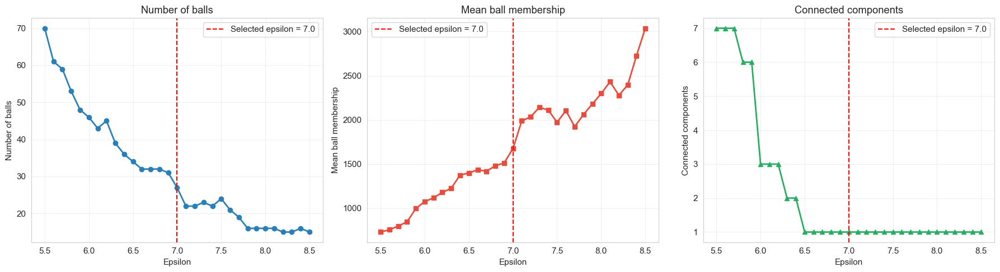

In [8]:
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
axes[0].plot(eps_df["eps"], eps_df["n_balls"], marker="o", color="#2980b9", lw=2)
axes[0].axvline(EPS_MAIN, color="red", linestyle="--", lw=1.5, label=f"Selected epsilon = {EPS_MAIN}")
axes[0].set_xlabel("Epsilon")
axes[0].set_ylabel("Number of balls")
axes[0].set_title("Number of balls")
axes[0].legend()
axes[0].grid(True, alpha=0.3)

axes[1].plot(eps_df["eps"], eps_df["avg_ball_size"], marker="s", color="#e74c3c", lw=2)
axes[1].axvline(EPS_MAIN, color="red", linestyle="--", lw=1.5, label=f"Selected epsilon = {EPS_MAIN}")
axes[1].set_xlabel("Epsilon")
axes[1].set_ylabel("Mean ball membership")
axes[1].set_title("Mean ball membership")
axes[1].legend()
axes[1].grid(True, alpha=0.3)

axes[2].plot(eps_df["eps"], eps_df["n_components"], marker="^", color="#27ae60", lw=2)
axes[2].axvline(EPS_MAIN, color="red", linestyle="--", lw=1.5, label=f"Selected epsilon = {EPS_MAIN}")
axes[2].set_xlabel("Epsilon")
axes[2].set_ylabel("Connected components")
axes[2].set_title("Connected components")
axes[2].legend()
axes[2].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig(FIG_DIR / "bank_tdabm_pyballmapper_R1_epsilon_sensitivity.png", dpi=150, bbox_inches="tight", facecolor="white")
plt.show()


## Node sizes

**Inputs:** Global size settings used by the drawing helper.

**Steps:**

1. Set the minimum marker area to 300.
2. Set the maximum marker area to 5500.

**Outputs:** `NODE_SIZE_MIN` and `NODE_SIZE_MAX` used by `draw_pbm_custom`.


In [9]:
# Minimum and maximum node areas.
NODE_SIZE_MIN = 300
NODE_SIZE_MAX = 5500


## Main graph colourings

**Inputs:** `bm_df`, `X`, effective main radius, colour labels and node-size settings.

**Steps:**

1. Build `main_bm` once with the fixed landmark order.
2. Compute one seeded spring layout and keep it for every recolouring.
3. Report graph statistics and loop through the two outcomes and 30 census features.
4. Call the custom renderer with the same graph and positions, changing only the colour variable and filename.

**Outputs:** `main_bm`, `main_pos` and 32 `bank_tdabm_pyballmapper_colour_<variable>.png` figures.


Main pyballmapper BM: {'eps': 7.0, 'n_balls': 27, 'n_edges': 174, 'n_components': 1, 'avg_ball_size': 1674.3333333333333, 'max_ball_size': 6558, 'avg_overlaps': 3.9126709364722174}


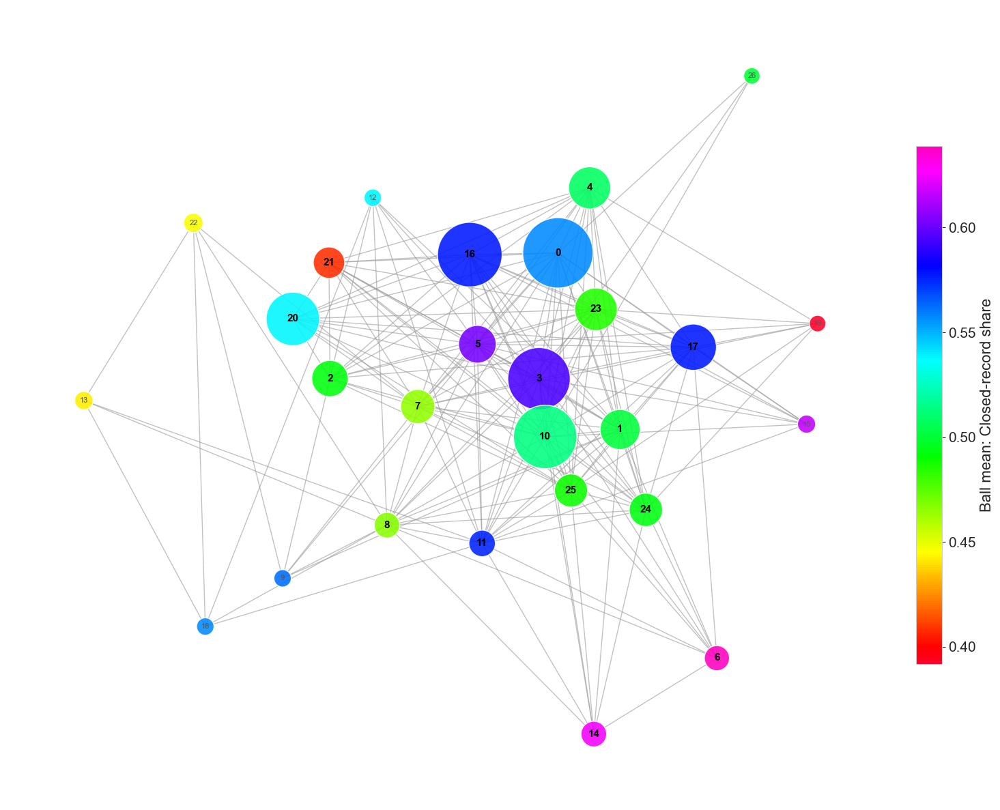

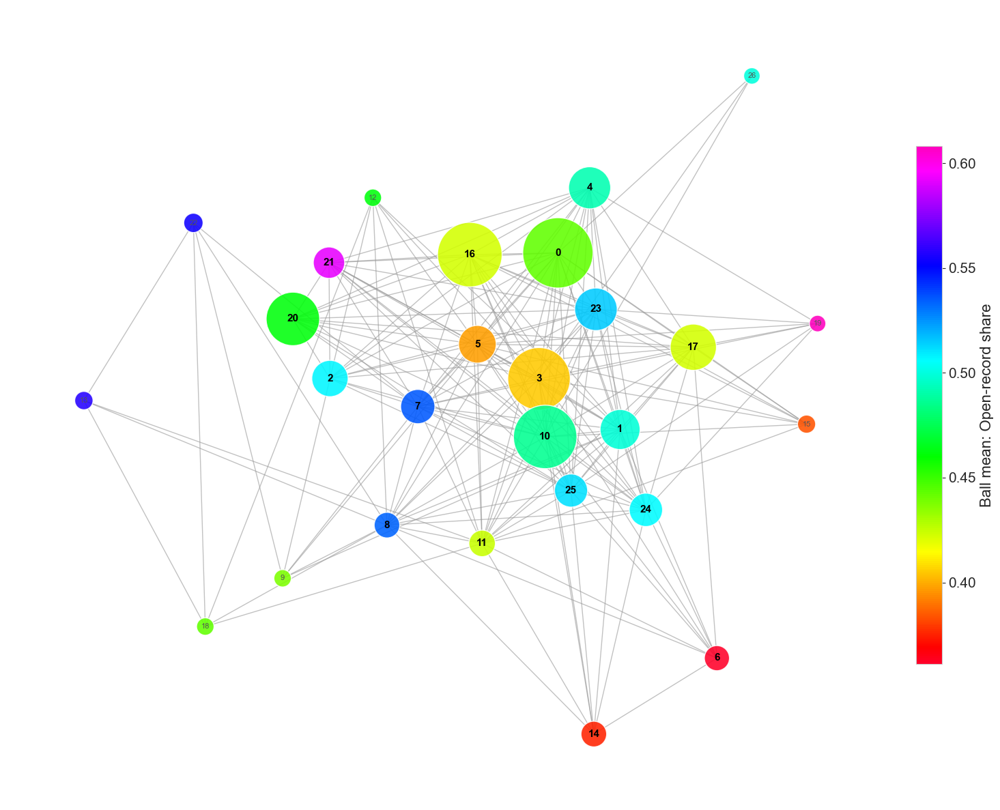

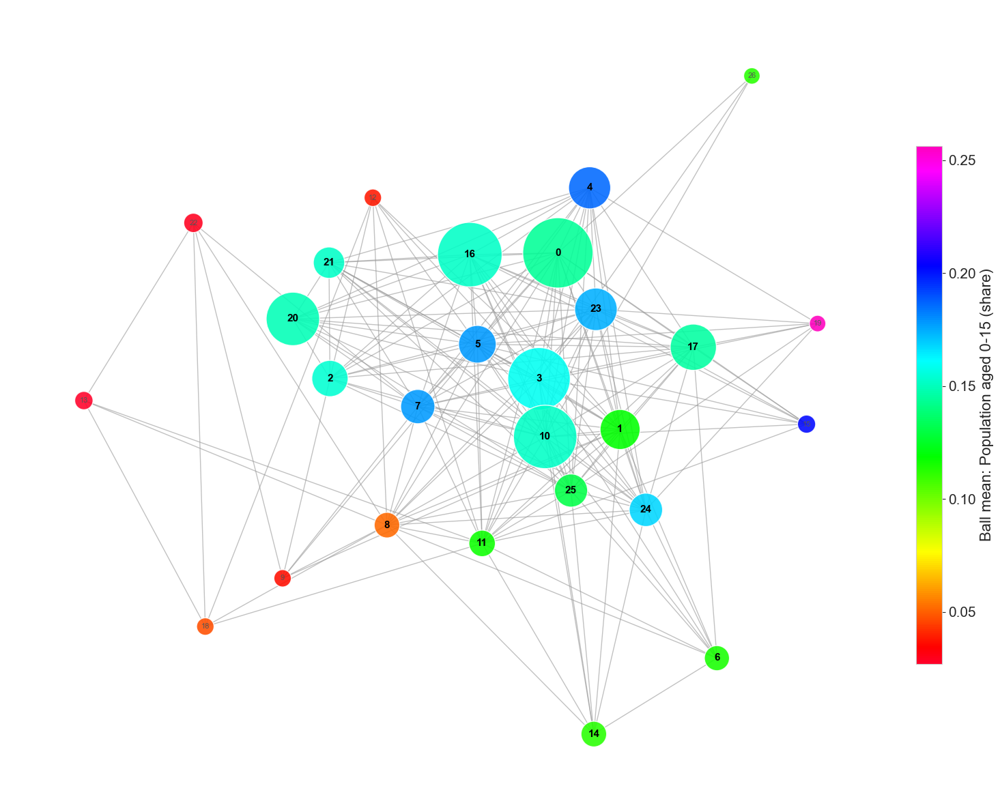

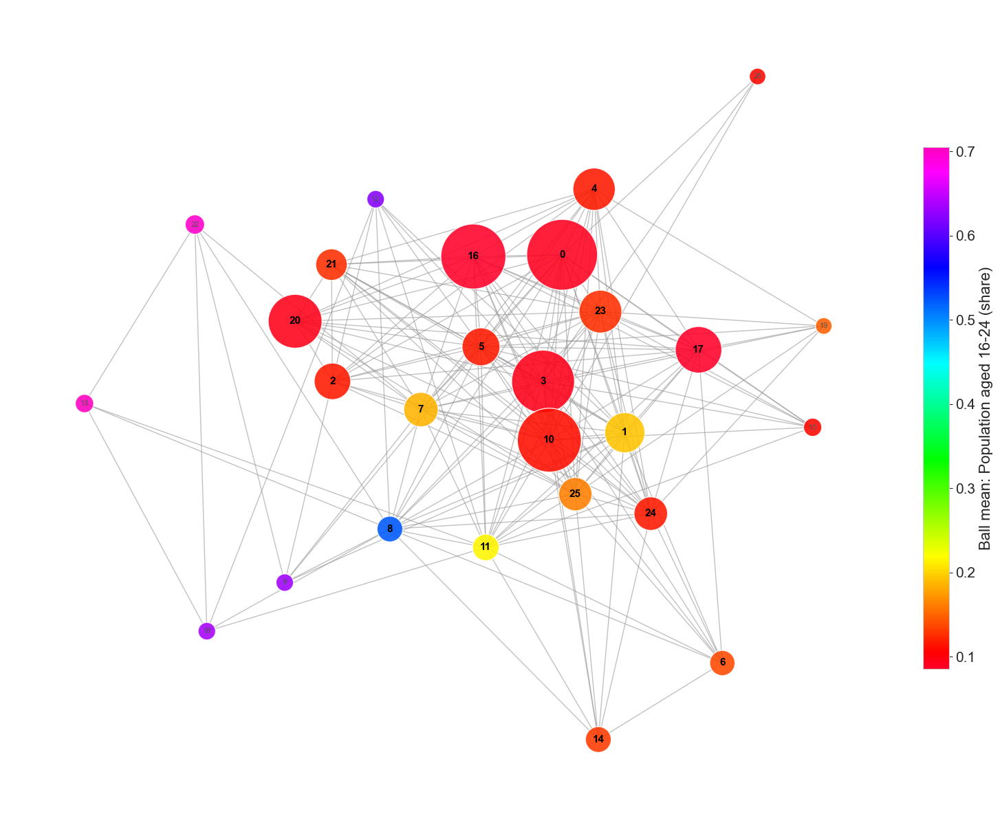

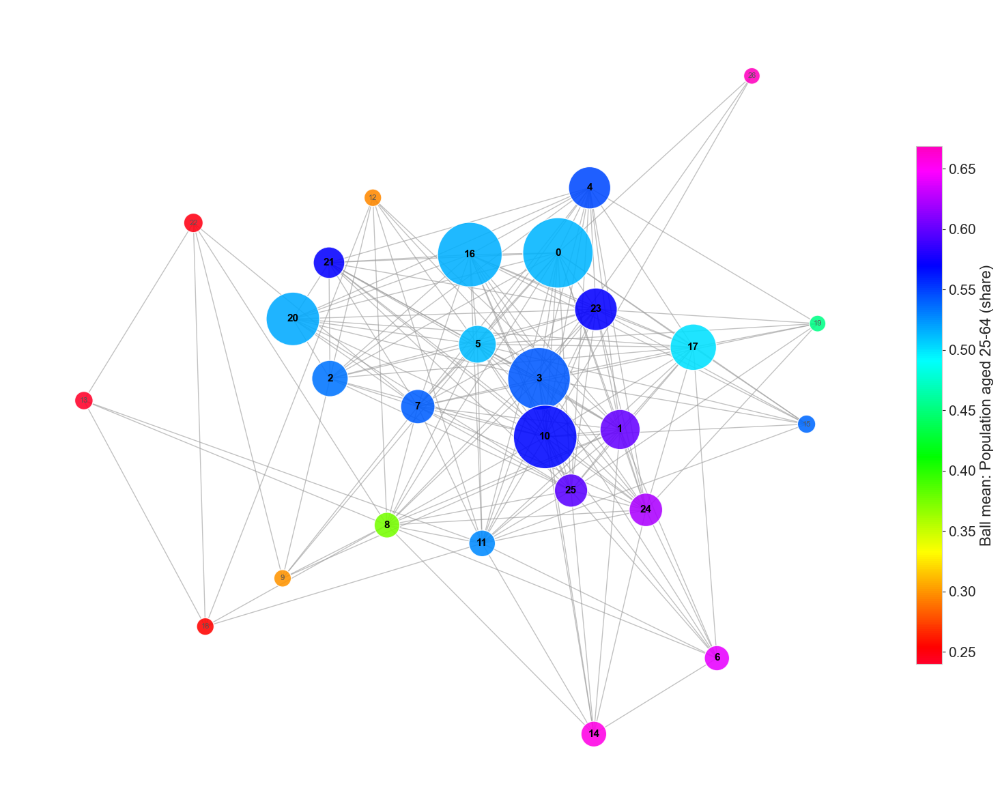

...

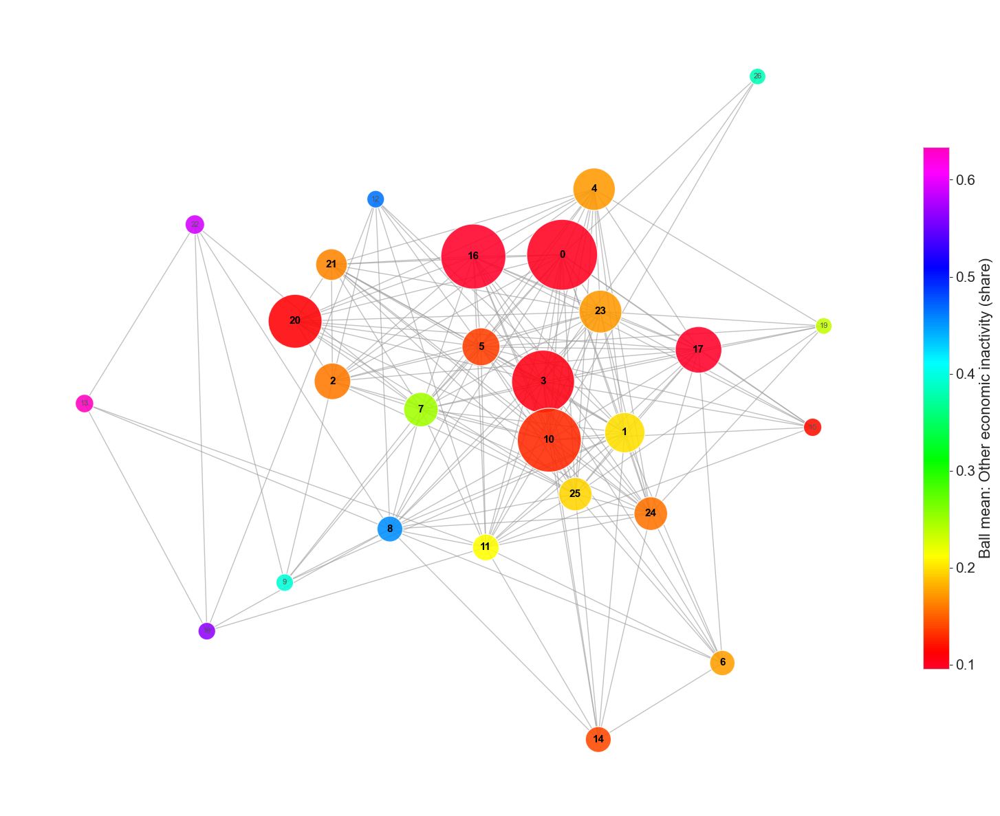

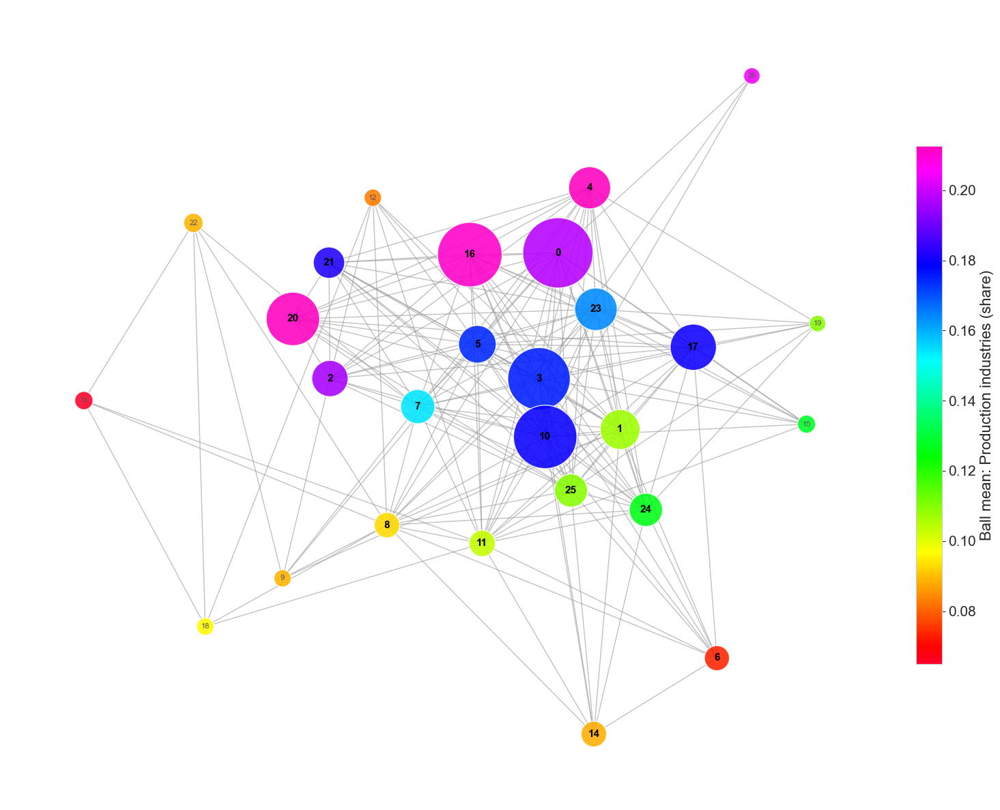

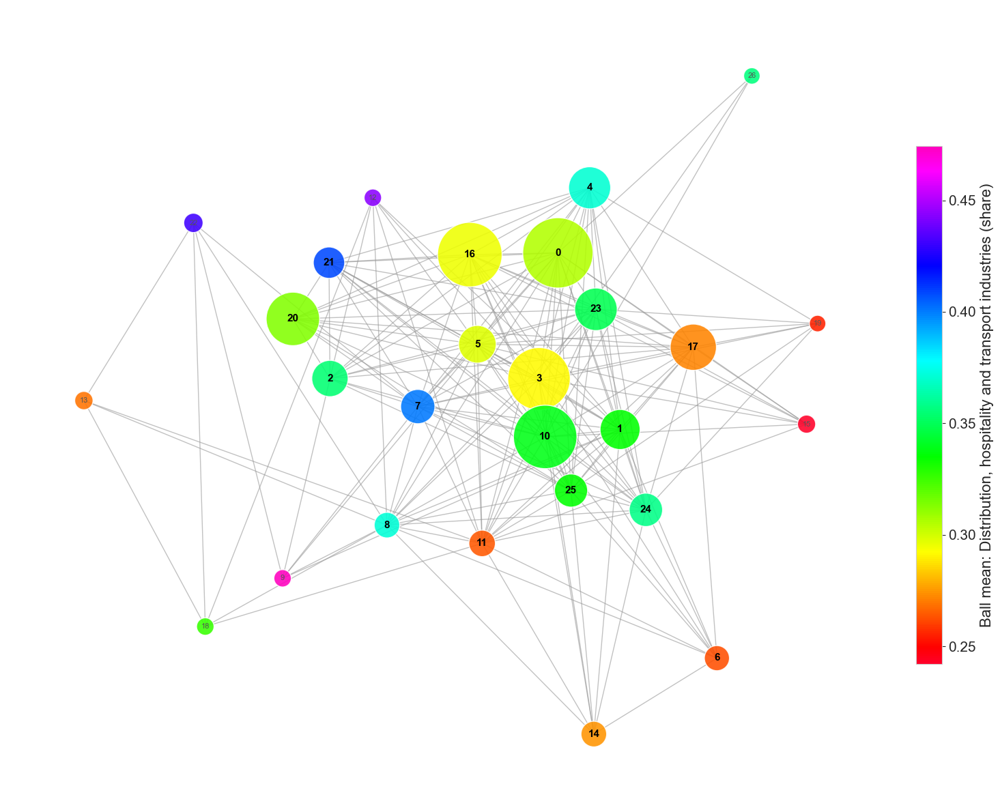

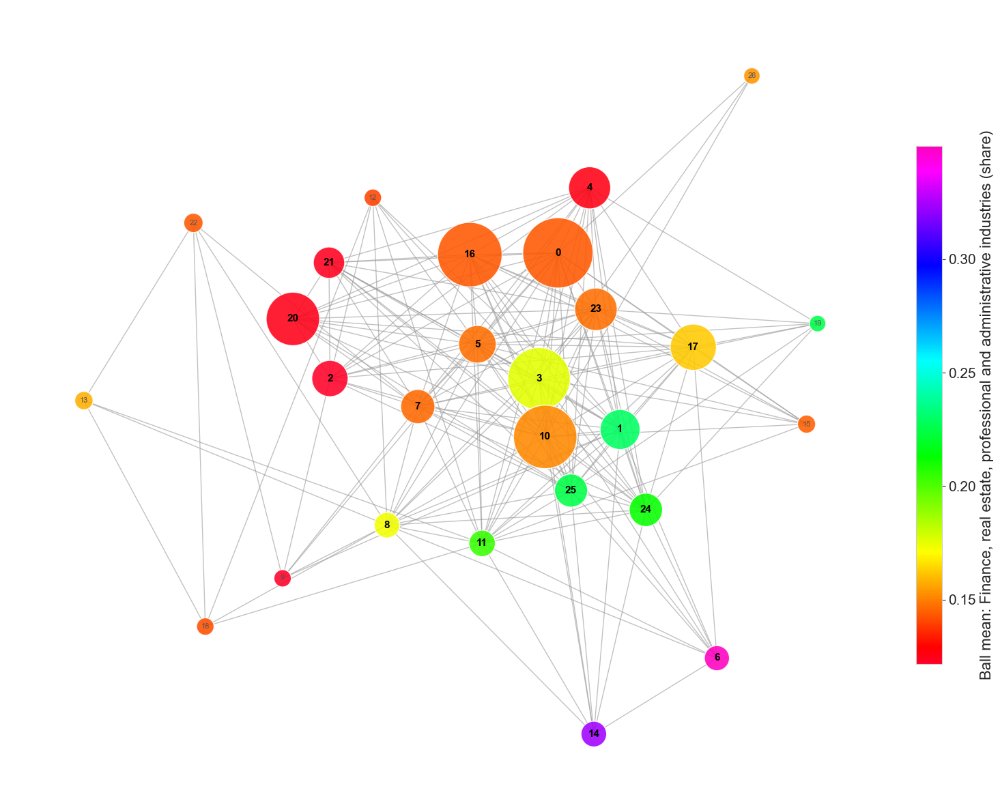

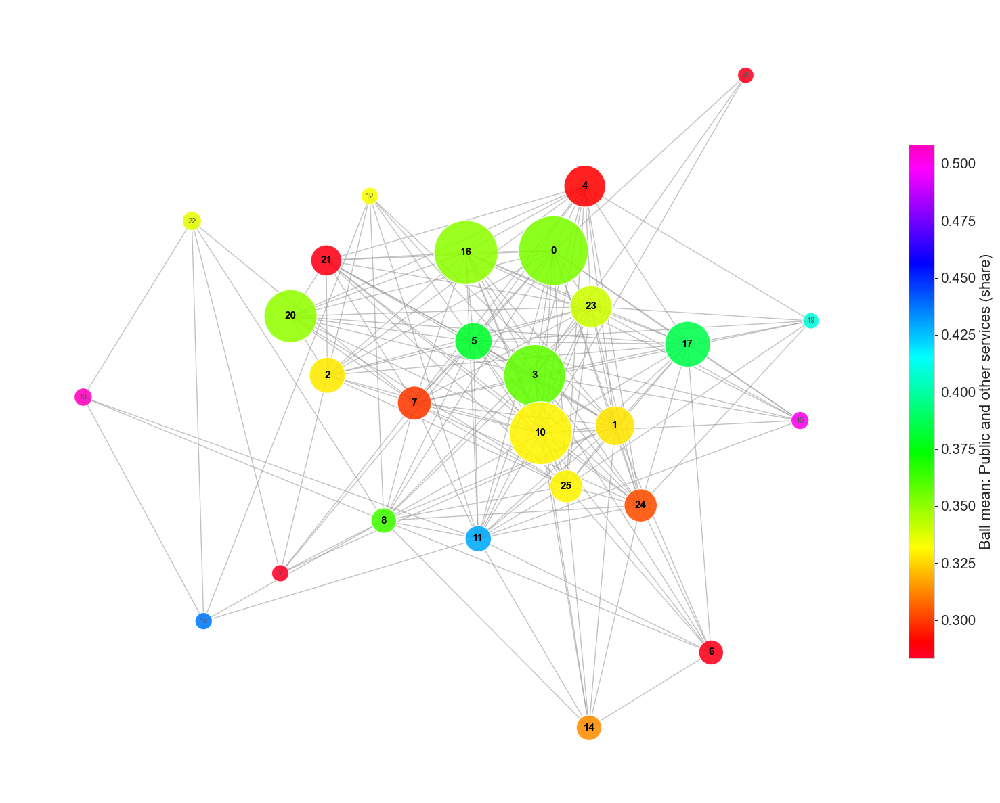

In [10]:
# Reuse one graph and layout for all colour variables.
main_bm = build_pbm(X, EPS_MAIN)
main_pos = nx.spring_layout(main_bm.Graph, k=1.5, scale=1.0, seed=SEED)
print("Main pyballmapper BM:", bm_stats_pbm(X, EPS_MAIN))

for var in COLOR_VARS:
    label = COLOR_LABELS[var]
    draw_pbm_custom(
        bm_df, X, EPS_MAIN, var,
        colorbar_label=f"Ball mean: {label}",
        filename=f"bank_tdabm_pyballmapper_colour_{var}.png",
        pos=main_pos,
        bm=main_bm,
    )


## Ball summaries

**Inputs:** `main_bm`, `bm_df`, the positional membership table and available auxiliary indicators.

**Steps:**

1. Create a position-to-identifier/outcome table and append selected census display variables.
2. Join each observation to all its ball memberships.
3. Count rows and average outcomes/indicators by ball, show the highest positive-outcome means and save the full summary.

**Outputs:** `bank_tdabm_pyballmapper_ball_summary.csv`.

In [11]:
membership = points_and_balls_df(main_bm).rename(columns={"point": "_point"})
summary_base = pd.DataFrame({
    "_point": np.arange(len(bm_df), dtype=int),
    ID_COL: bm_df[ID_COL].to_numpy(),
    SPLIT_VAR: get_numeric_series(bm_df, SPLIT_VAR).to_numpy(),
})
for c in ["cars_0_pct", "age_65_plus_pct", "health_bad_very_bad_pct", "education_no_qualifications_pct"]:
    if c in bm_df.columns:
        summary_base[c] = get_numeric_series(bm_df, c).to_numpy()

merged = summary_base.merge(membership, on="_point", how="inner")
agg = {ID_COL: "count", SPLIT_VAR: "mean"}
for c in ["cars_0_pct", "age_65_plus_pct", "health_bad_very_bad_pct", "education_no_qualifications_pct"]:
    if c in merged.columns:
        agg[c] = "mean"
ball_summary = merged.groupby("ball", sort=True).agg(agg).rename(columns={ID_COL: "n_rows", SPLIT_VAR: f"{SPLIT_VAR}_mean"})
display(ball_summary.sort_values(f"{SPLIT_VAR}_mean", ascending=False).head(20))
ball_summary.to_csv(TABLE_DIR / "bank_tdabm_pyballmapper_ball_summary.csv")


,n_rows,is_closed_mean,cars_0_pct,age_65_plus_pct,health_bad_very_bad_pct,education_no_qualifications_pct
ball,,,,,,
6,508,0.653543,0.605876,0.104061,0.028056,0.076753
14,547,0.625229,0.502889,0.099988,0.026151,0.073337
15,86,0.616279,0.178024,0.152707,0.038268,0.117955
5,1614,0.602230,0.280424,0.194201,0.059070,0.185374
3,5096,0.594780,0.243768,0.205434,0.048558,0.154299
16,5469,0.577436,0.245006,0.245420,0.061993,0.193133
17,2624,0.577363,0.238224,0.270601,0.062354,0.167371
11,608,0.575658,0.368394,0.139111,0.032996,0.079488
9,48,0.562500,0.592001,0.030951,0.027628,0.040482


## Selected memberships

**Inputs:** `main_bm`, `bm_df`, full eligible `df` and branch town/suburb fields.

**Steps:**

1. Set `SELECTED_BALLS=[6, 14, 5, 15]`.
2. Convert identifiers to integers, deduplicate the requested list while retaining order, and reject an empty list or nonexistent balls.
3. Use a `.loc` callable (the inline lambda) to select membership rows, retaining one row per point-ball combination.
4. Join positions back to stable source IDs and eligible source records.
5. Fill `city_or_town` from stripped town, then suburb, then area name.
6. Display per-ball membership/unique-ID counts and a sorted 100-row observation preview.

**Outputs:** `branch_selected_ball_memberships`, a deliberately overlapping long table for the next deduplication block.


In [12]:
# Select existing ball numbers.
SELECTED_BALLS = [6, 14, 5, 15]

selected_balls = list(dict.fromkeys(int(ball) for ball in SELECTED_BALLS))
if not selected_balls:
    raise ValueError("SELECTED_BALLS must contain at least one ball number.")
available_balls = {int(ball) for ball in main_bm.Graph.nodes}
missing_balls = sorted(set(selected_balls) - available_balls)
if missing_balls:
    raise ValueError(f"Ball numbers not present in the main graph: {missing_balls}")

# Retain overlaps until the next block.
selected_memberships = (
    points_and_balls_df(main_bm)
    .loc[lambda x: x["ball"].isin(selected_balls), ["point", "ball"]]
    .rename(columns={"point": "_point", "ball": "source_ball"})
)
point_lookup = pd.DataFrame({
    "_point": np.arange(len(bm_df), dtype=int),
    ID_COL: bm_df[ID_COL].to_numpy(),
})
branch_selected_ball_memberships = (
    selected_memberships
    .merge(point_lookup, on="_point", how="left", validate="many_to_one")
    .merge(df, on=ID_COL, how="left", validate="many_to_one")
)
branch_selected_ball_memberships["city_or_town"] = (
    branch_selected_ball_memberships["town"].astype("string").str.strip().replace("", pd.NA)
    .fillna(branch_selected_ball_memberships["suburb"].astype("string").str.strip().replace("", pd.NA))
    .fillna(branch_selected_ball_memberships["area_name"].astype("string"))
)

print(f"Selected balls: {selected_balls}")
print(f"Membership rows before overlap removal: {len(branch_selected_ball_memberships):,}")
display(
    branch_selected_ball_memberships.groupby("source_ball", sort=False)
    .agg(memberships=(ID_COL, "size"), unique_branches=(ID_COL, "nunique"))
)
display(
    branch_selected_ball_memberships[[
        "source_ball", "id", "brand_full", "branch_name", "status",
        "city_or_town", "area_code", "area_name", "country",
    ]].sort_values(["source_ball", "country", "city_or_town", "branch_name"], na_position="last").head(100)
)


Selected balls: [6, 14, 5, 15]
Membership rows before overlap removal: 2,755


,memberships,unique_branches
source_ball,,
5,1614,1614
6,508,508
14,547,547
15,86,86


,source_ball,id,brand_full,branch_name,status,city_or_town,area_code,area_name,country
992,5,7913,Royal Bank of Scotland,RBS Adlington,Closed,Adlington,E01024917,Chorley 014C,England
880,5,7228,NatWest,NatWest Timperley,Closed,Altrincham,E01006204,Trafford 022A,England
1335,5,5132,Lloyds,Lloyds Ashburton,Closed,Ashburton,E01020196,Teignbridge 017B,England
470,5,7154,NatWest,NatWest Ashburton Mobile Branch,Closed,Ashburton,E01020196,Teignbridge 017B,England
1152,5,10294,NatWest,NatWest Ashburton Mobile Branch,Open,Ashburton,E01020196,Teignbridge 017B,England
1222,5,2684,Halifax,Halifax Ashford,Open,"Ashford, Kent",E01034985,Ashford 005F,England
1165,5,10231,Handelsbanken,Handelsbanken Ashford,Closed,"Ashford, Kent",E01024023,Ashford 005C,England
874,5,7992,Royal Bank of Scotland,RBS Ashford,Closed,"Ashford, Kent",E01034985,Ashford 005F,England
68,5,7924,Royal Bank of Scotland,RBS Swallownest,Closed,"Aughton, South Yorkshire",E01007671,Rotherham 031A,England
759,5,1169,Barclays,Barclays Bacup,Closed,Bacup,E01025369,Rossendale 003C,England


## Unique selected observations

**Inputs:** `branch_selected_ball_memberships` from the preceding selection block.

**Steps:**

1. Group by the stable source ID and use a lambda to sort unique selected ball numbers and join them with semicolons.
2. Sort membership rows, retain one record per source ID and attach the complete selected-membership string.
3. Count memberships from semicolon separators and flag observations shared by more than one selected ball.
4. Move identifying/status fields to the front, save the CSV, assert unique source IDs and display a preview.

**Outputs:** `branch level chosed ball.csv` and an in-memory table of unique observations.


In [13]:
# Collapse overlapping ball memberships to one row per original branch observation.
branch_membership_map = (
    branch_selected_ball_memberships.groupby(ID_COL, sort=False)["source_ball"]
    .agg(lambda values: ";".join(map(str, sorted(set(values)))))
    .rename("ball_memberships")
)
branch_level_chosed_ball = (
    branch_selected_ball_memberships.sort_values([ID_COL, "source_ball"])
    .drop_duplicates(ID_COL, keep="first")
    .drop(columns="source_ball")
    .merge(branch_membership_map, left_on=ID_COL, right_index=True, how="left", validate="one_to_one")
)
branch_level_chosed_ball["selected_ball_count"] = (
    branch_level_chosed_ball["ball_memberships"].str.count(";") + 1
)
branch_level_chosed_ball["shared_between_selected_balls"] = (
    branch_level_chosed_ball["selected_ball_count"] > 1
)
if "is_closed" not in branch_level_chosed_ball.columns:
    branch_level_chosed_ball["is_closed"] = branch_level_chosed_ball["status"].eq("Closed").astype(int)

front_columns = [
    "ball_memberships", "selected_ball_count", "shared_between_selected_balls",
    "id", "brand_full", "branch_name", "status", "is_closed", "city_or_town",
    "town", "postcode", "area_code", "area_name", "country", "region", "close_year",
]
branch_level_chosed_ball = branch_level_chosed_ball[
    [column for column in front_columns if column in branch_level_chosed_ball.columns]
    + [column for column in branch_level_chosed_ball.columns if column not in front_columns]
]

branch_output_file = TABLE_DIR / "branch level chosed ball.csv"
branch_level_chosed_ball.to_csv(branch_output_file, index=False)
assert not branch_level_chosed_ball[ID_COL].duplicated().any()
print(f"Unique branch observations: {len(branch_level_chosed_ball):,}")
print(f"Observations shared by selected balls: {branch_level_chosed_ball['shared_between_selected_balls'].sum():,}")
print(f"Saved unique data: {branch_output_file}")
display(branch_level_chosed_ball[[column for column in front_columns if column in branch_level_chosed_ball.columns]].head(100))


Unique branch observations: 2,414
Observations shared by selected balls: 341
Saved unique data: C:\Users\liwen\Documents\ERP Topological data science\材料提交\Additional_Materials_Submission\results\tdabm_tables\branch level chosed ball.csv


,ball_memberships,selected_ball_count,shared_between_selected_balls,id,brand_full,branch_name,status,is_closed,city_or_town,town,postcode,area_code,area_name,country,region,close_year
2009,6,1,False,35,Allied Irish Bank,Allied Irish Bank Moorgate,Closed,1,London,London,EC2A 1DS,E01002704,Islington 023D,England,London,2021.0
1674,6;14,2,True,36,Allied Irish Bank,Allied Irish Bank Edinburgh,Closed,1,Edinburgh,Edinburgh,EH2 4DE,S01014926,NaN,Scotland,Scotland,2021.0
2287,14,1,False,38,Allied Irish Bank,Allied Irish Bank Liverpool,Closed,1,Liverpool,Liverpool,L3 9PP,E01034410,Liverpool 062F,England,North West,2021.0
2323,14,1,False,40,Allied Irish Bank,Allied Irish Bank Manchester,Closed,1,Manchester,Manchester,M3 3PL,E01033681,Manchester 060B,England,North West,2021.0
1761,6;14,2,True,43,Allied Irish Bank,Allied Irish Bank Hampstead,Closed,1,London,London,NW3 6BX,E01000881,Camden 008A,England,London,2021.0
1781,6,1,False,44,Allied Irish Bank,Allied Irish Bank Mayfair,Closed,1,London,London,W1J 6AA,E01035716,Westminster 013G,England,London,2021.0
2216,14,1,False,45,Allied Irish Bank,Allied Irish Bank Ealing,Closed,1,London,London,W5 5TH,E01001387,Ealing 032E,England,London,2021.0
2667,14,1,False,81,Bank of Scotland,Bank of Scotland Aberdeen Queens Cross,Open,0,Aberdeen,Aberdeen,AB10 1YN,S01013550,NaN,Scotland,Scotland,NaN
1381,5,1,False,90,Bank of Scotland,Bank of Scotland Braemar,Closed,1,Braemar,Braemar,AB35 5YP,S01013786,NaN,Scotland,Scotland,2023.0
1262,5,1,False,120,Bank of Scotland,Bank of Scotland Annan,Open,0,Annan,Annan,DG12 6AB,S01015338,NaN,Scotland,Scotland,NaN


## Robustness checks

Feature-set checks vary the coordinates while keeping observations fixed. Repeated-landmark checks vary candidate order on the same observations and coordinates. Together they describe sensitivity to feature selection and the order used to construct the cover.


## Reduced features

**Inputs:** `bm_df`, `main_bm` and the 15 selected indicators.

**Steps:**

1. Define and count the 15 reduced variables, keeping the same observations as the main graph.
2. Fit a new StandardScaler and build `X_reduced`.
3. Define the permitted comparison band as 80%-120% of the current main ball count.
4. Scan 3.5-5.5 in 0.1 increments, recording graph statistics, count differences, ratios and whether each radius falls inside the band.
5. Export the scan, display candidate rows and plot ball count against radius with the comparison band.

**Outputs:** `X_reduced`, `reduced_eps_df`, shared ball-count bounds and `bank_tdabm_reduced_variables_epsilon_scan.csv/.png`.

Reduced scan 01/21 | eps=3.5 | balls=44 | difference=+17 | within +/-20%=False
Reduced scan 02/21 | eps=3.6 | balls=40 | difference=+13 | within +/-20%=False
Reduced scan 03/21 | eps=3.7 | balls=40 | difference=+13 | within +/-20%=False
Reduced scan 04/21 | eps=3.8 | balls=36 | difference=+9 | within +/-20%=False
Reduced scan 05/21 | eps=3.9 | balls=30 | difference=+3 | within +/-20%=True
Reduced scan 06/21 | eps=4.0 | balls=28 | difference=+1 | within +/-20%=True
Reduced scan 07/21 | eps=4.1 | balls=26 | difference=-1 | within +/-20%=True
Reduced scan 08/21 | eps=4.2 | balls=23 | difference=-4 | within +/-20%=True
Reduced scan 09/21 | eps=4.3 | balls=23 | difference=-4 | within +/-20%=True
Reduced scan 10/21 | eps=4.4 | balls=20 | difference=-7 | within +/-20%=False
Reduced scan 11/21 | eps=4.5 | balls=19 | difference=-8 | within +/-20%=False
Reduced scan 12/21 | eps=4.6 | balls=16 | difference=-11 | within +/-20%=False
Reduced scan 13/21 | eps=4.7 | balls=18 | difference=-9 | within 

,eps,n_balls,n_edges,n_components,avg_ball_size,max_ball_size,avg_overlaps,ball_count_difference,ball_count_ratio,within_main_20pct
0,3.5,44,279,1,884.954545,5753,3.370088,17,1.629630,False
1,3.6,40,245,1,955.100000,6096,3.306560,13,1.481481,False
2,3.7,40,252,1,993.575000,6471,3.439761,13,1.481481,False
3,3.8,36,207,1,1089.916667,6787,3.395967,9,1.333333,False
4,3.9,30,159,1,1199.533333,7119,3.114592,3,1.111111,True
5,4.0,28,139,1,1269.285714,7350,3.075991,1,1.037037,True
6,4.1,26,132,1,1357.269231,6585,3.054267,-1,0.962963,True
7,4.2,23,115,1,1522.956522,6922,3.031677,-4,0.851852,True
8,4.3,23,122,1,1607.086957,7261,3.199152,-4,0.851852,True
9,4.4,20,94,1,1784.650000,7563,3.089233,-7,0.740741,False


Reduced-variable candidate radii within +/-20% of the main ball count:


,eps,n_balls,n_edges,n_components,avg_ball_size,max_ball_size,avg_overlaps,ball_count_difference,ball_count_ratio,within_main_20pct
4,3.9,30,159,1,1199.533333,7119,3.114592,3,1.111111,True
5,4.0,28,139,1,1269.285714,7350,3.075991,1,1.037037,True
6,4.1,26,132,1,1357.269231,6585,3.054267,-1,0.962963,True
7,4.2,23,115,1,1522.956522,6922,3.031677,-4,0.851852,True
8,4.3,23,122,1,1607.086957,7261,3.199152,-4,0.851852,True


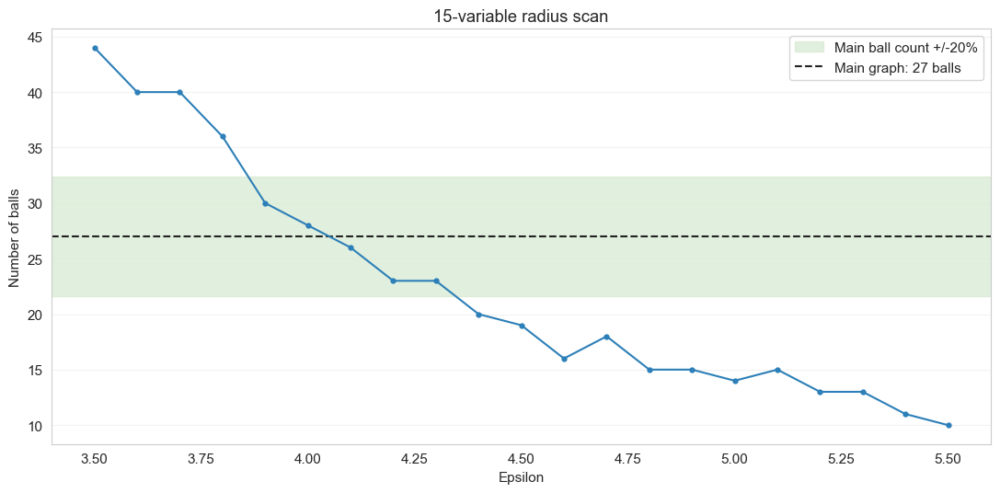

In [14]:
REDUCED_FEATURES = [
    "age_16_24_pct", "age_65_plus_pct", "deprived_2_plus_pct", "cars_0_pct",
    "health_other_pct", "disabled_pct", "education_low_pct", "education_higher_pct",
    "nssec_managerial_professional_small_employers_pct", "nssec_semi_routine_routine_pct",
    "nssec_never_worked_long_term_unemployed_pct", "unemployed_pct", "inactive_retired_pct",
    "industry_production_pct", "industry_finance_real_estate_professional_admin_pct",
]
assert len(REDUCED_FEATURES) == 15


# Keep exactly the observations used by the 30-variable main graph.
X_reduced = StandardScaler().fit_transform(bm_df[REDUCED_FEATURES])
MAIN_BALL_COUNT = main_bm.Graph.number_of_nodes()
BALL_COUNT_MIN = 0.80 * MAIN_BALL_COUNT
BALL_COUNT_MAX = 1.20 * MAIN_BALL_COUNT

REDUCED_EPS_MIN = 3.5
REDUCED_EPS_MAX = 5.5
reduced_eps_values = np.round(np.arange(REDUCED_EPS_MIN, REDUCED_EPS_MAX + 0.001, 0.1), 1)
reduced_records = []
for scan_number, eps in enumerate(reduced_eps_values, start=1):
    rec = bm_stats_pbm(X_reduced, eps)
    rec["ball_count_difference"] = rec["n_balls"] - MAIN_BALL_COUNT
    rec["ball_count_ratio"] = rec["n_balls"] / MAIN_BALL_COUNT
    rec["within_main_20pct"] = 0.80 <= rec["ball_count_ratio"] <= 1.20
    reduced_records.append(rec)
    print(
        f"Reduced scan {scan_number:02d}/{len(reduced_eps_values)} | eps={eps:.1f} | "
        f"balls={rec['n_balls']} | difference={rec['ball_count_difference']:+d} | "
        f"within +/-20%={rec['within_main_20pct']}"
    )

reduced_eps_df = pd.DataFrame(reduced_records)
reduced_eps_df.to_csv(
    TABLE_DIR / "bank_tdabm_reduced_variables_epsilon_scan.csv", index=False
)
display(reduced_eps_df)
print("Reduced-variable candidate radii within +/-20% of the main ball count:")
display(reduced_eps_df.loc[reduced_eps_df["within_main_20pct"]])

fig, ax = plt.subplots(figsize=(11, 5.5))
ax.axhspan(BALL_COUNT_MIN, BALL_COUNT_MAX, color="#d8ead3", alpha=0.75, label="Main ball count +/-20%")
ax.axhline(MAIN_BALL_COUNT, color="#222222", linestyle="--", linewidth=1.5, label=f"Main graph: {MAIN_BALL_COUNT} balls")
ax.plot(reduced_eps_df["eps"], reduced_eps_df["n_balls"], color="#2c7fb8", marker="o", markersize=3.5)
ax.set(xlabel="Epsilon", ylabel="Number of balls", title="15-variable radius scan")
ax.legend(frameon=True)
ax.grid(axis="y", alpha=0.25)
ax.grid(axis="x", visible=False)
plt.tight_layout()
plt.savefig(FIG_DIR / "bank_tdabm_reduced_variables_epsilon_scan.png", dpi=180, bbox_inches="tight", facecolor="white")
plt.show()


## Reduced graph

**Inputs:** `X_reduced`, its radius scan, main-sample `bm_df` and the drawing settings.

**Steps:**

1. Set `EPS_REDUCED_MANUAL=4.0` and find its scan row using `np.isclose`.
2. Raise an error if it is absent from the scanned grid; print a warning, but continue, if its ball count lies outside the guide band.
3. Construct the reduced graph, calculate its own spring layout and draw the closed branch colouring.

**Outputs:** `reduced_bm`, `reduced_pos` and `bank_tdabm_reduced_variables_outcome.png`.

,eps,n_balls,n_edges,n_components,avg_ball_size,max_ball_size,avg_overlaps,ball_count_difference,ball_count_ratio,within_main_20pct
5,4.0,28,139,1,1269.285714,7350,3.075991,1,1.037037,True


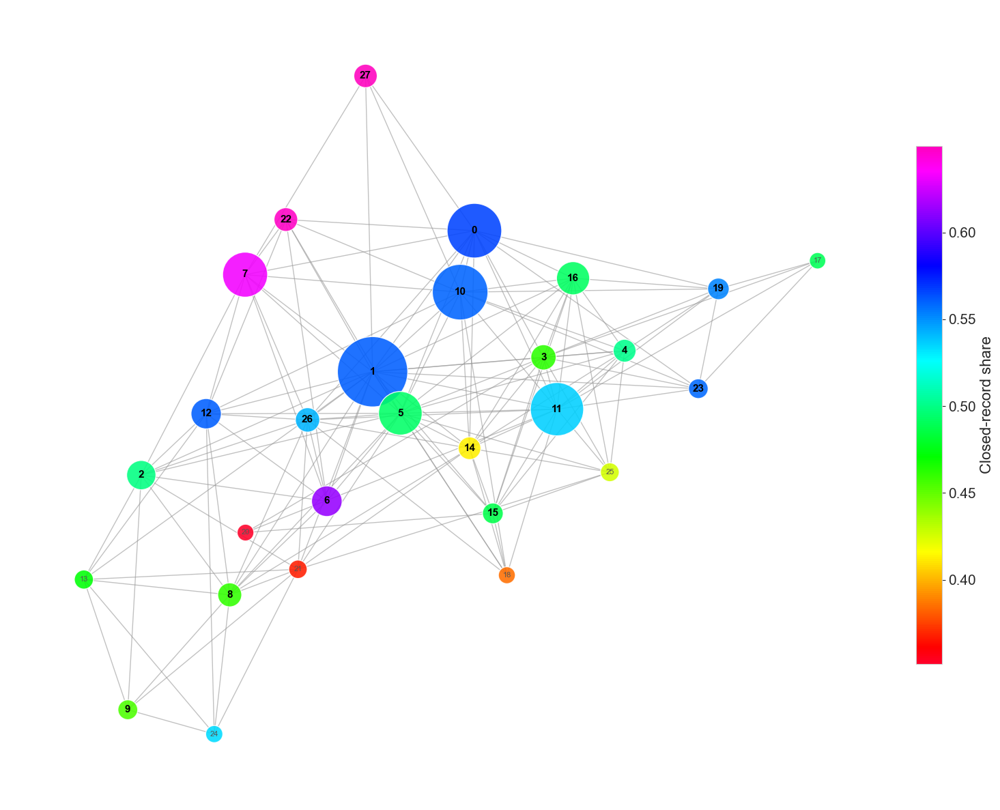

(<pyballmapper.ballmapper.BallMapper at 0x2322c5d0910>,
 {0: array([0.49245292, 1.42462415]),
  1: array([-0.2515386 ,  0.36120506]),
  2: array([-1.94177337, -0.41784369]),
  3: array([0.99712394, 0.46975019]),
  4: array([1.58991747, 0.5196976 ]),
  5: array([-0.04862671,  0.0482897 ]),
  6: array([-0.58596373, -0.61463499]),
  7: array([-1.18308954,  1.09307792]),
  8: array([-1.29541021, -1.32043487]),
  9: array([-2.0401636 , -2.18645934]),
  10: array([0.38823724, 0.96122991]),
  11: array([1.09584752, 0.0791419 ]),
  12: array([-1.46773137,  0.04483613]),
  13: array([-2.36126721, -1.20501839]),
  14: array([ 0.45687668, -0.21538001]),
  15: array([ 0.62720379, -0.70628818]),
  16: array([1.21336933, 1.06613598]),
  17: array([3.        , 1.19812119]),
  18: array([ 0.72953743, -1.17250568]),
  19: array([2.27545832, 0.98603409]),
  20: array([-1.18017599, -0.85112418]),
  21: array([-0.7968583 , -1.12773229]),
  22: array([-0.88524627,  1.50841443]),
  23: array([2.12848773, 0.

In [15]:
# Select the radius after inspecting the scan.
EPS_REDUCED_MANUAL = 4.0

reduced_choice = reduced_eps_df.loc[np.isclose(reduced_eps_df["eps"], EPS_REDUCED_MANUAL)]
if reduced_choice.empty:
    raise ValueError("EPS_REDUCED_MANUAL must be inside REDUCED_EPS_MIN--REDUCED_EPS_MAX in steps of 0.1.")
display(reduced_choice)
if not bool(reduced_choice["within_main_20pct"].iloc[0]):
    print("Warning: this radius produces a ball count outside the main graph +/-20% range.")

reduced_bm = build_pbm(X_reduced, EPS_REDUCED_MANUAL)
reduced_pos = nx.spring_layout(reduced_bm.Graph, k=1.0, scale=3.0, seed=SEED)
draw_pbm_custom(
    bm_df, X_reduced, EPS_REDUCED_MANUAL, SPLIT_VAR,
    colorbar_label="Closed-record share",
    filename="bank_tdabm_reduced_variables_outcome.png",
    pos=reduced_pos, bm=reduced_bm,
)


## Expanded features

**Inputs:** `df` with detailed shares, stable `ID_COL`, main-sample `bm_df`, and the ball-count bounds defined in the reduced scan.

**Steps:**

1. Define exactly 49 detailed census coordinates.
2. Reindex eligible source rows to the main sample’s stable IDs and order, replace infinities and stop if any required detailed value is missing.
3. Fit a new StandardScaler without changing the sample.
4. Scan 9.0-11.0 in increments of 0.1, collecting graph statistics and main-count ratios.
5. Export the scan, display radii within the guide band and plot the resolution comparison.

**Outputs:** `expanded_frame`, `X_expanded`, `expanded_eps_df` and `bank_tdabm_expanded_variables_epsilon_scan.csv/.png`.

Expanded scan 01/21 | eps=9.0 | balls=44 | difference=+17 | within +/-20%=False
Expanded scan 02/21 | eps=9.1 | balls=39 | difference=+12 | within +/-20%=False
Expanded scan 03/21 | eps=9.2 | balls=38 | difference=+11 | within +/-20%=False
Expanded scan 04/21 | eps=9.3 | balls=34 | difference=+7 | within +/-20%=False
Expanded scan 05/21 | eps=9.4 | balls=34 | difference=+7 | within +/-20%=False
Expanded scan 06/21 | eps=9.5 | balls=33 | difference=+6 | within +/-20%=False
Expanded scan 07/21 | eps=9.6 | balls=31 | difference=+4 | within +/-20%=True
Expanded scan 08/21 | eps=9.7 | balls=29 | difference=+2 | within +/-20%=True
Expanded scan 09/21 | eps=9.8 | balls=29 | difference=+2 | within +/-20%=True
Expanded scan 10/21 | eps=9.9 | balls=29 | difference=+2 | within +/-20%=True
Expanded scan 11/21 | eps=10.0 | balls=28 | difference=+1 | within +/-20%=True
Expanded scan 12/21 | eps=10.1 | balls=27 | difference=+0 | within +/-20%=True
Expanded scan 13/21 | eps=10.2 | balls=28 | differenc

,eps,n_balls,n_edges,n_components,avg_ball_size,max_ball_size,avg_overlaps,ball_count_difference,ball_count_ratio,within_main_20pct
0,9.0,44,410,3,1419.068182,6465,5.404102,17,1.629630,False
1,9.1,39,312,3,1520.846154,6657,5.133547,12,1.444444,False
2,9.2,38,298,4,1522.842105,6867,5.008482,11,1.407407,False
3,9.3,34,251,3,1638.470588,7033,4.821534,7,1.259259,False
4,9.4,34,258,3,1658.911765,7226,4.881686,7,1.259259,False
5,9.5,33,249,3,1775.363636,7457,5.070711,6,1.222222,False
6,9.6,31,220,3,1919.258065,7686,5.149472,4,1.148148,True
7,9.7,29,196,3,1915.965517,7832,4.808984,2,1.074074,True
8,9.8,29,208,2,1867.241379,7672,4.686689,2,1.074074,True
9,9.9,29,201,2,1814.034483,7768,4.553142,2,1.074074,True


Expanded-variable candidate radii within +/-20% of the main ball count:


,eps,n_balls,n_edges,n_components,avg_ball_size,max_ball_size,avg_overlaps,ball_count_difference,ball_count_ratio,within_main_20pct
6,9.6,31,220,3,1919.258065,7686,5.149472,4,1.148148,True
7,9.7,29,196,3,1915.965517,7832,4.808984,2,1.074074,True
8,9.8,29,208,2,1867.241379,7672,4.686689,2,1.074074,True
9,9.9,29,201,2,1814.034483,7768,4.553142,2,1.074074,True
10,10.0,28,194,2,1973.928571,7885,4.783625,1,1.037037,True
11,10.1,27,195,2,2154.037037,7969,5.033668,0,1.000000,True
12,10.2,28,226,2,2297.821429,8128,5.568548,1,1.037037,True
13,10.3,25,173,2,2369.760000,8255,5.127575,-2,0.925926,True
14,10.4,23,148,2,2483.695652,8354,4.944175,-4,0.851852,True
15,10.5,22,135,2,2352.000000,8455,4.478449,-5,0.814815,True


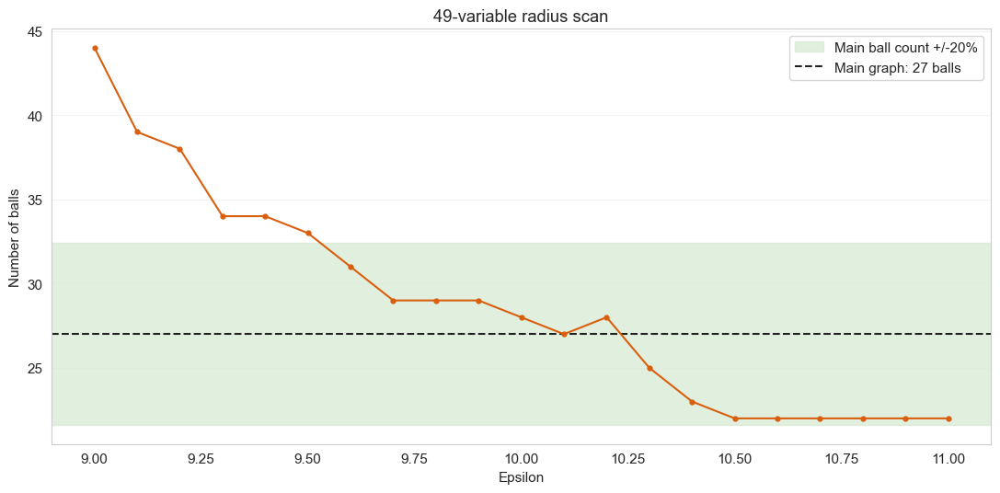

In [16]:
EXPANDED_FEATURES = [
    "age_0_15_pct", "age_16_24_pct", "age_25_34_pct", "age_35_49_pct", "age_50_64_pct", "age_65_plus_pct",
    "deprived_0_pct", "deprived_1_pct", "deprived_2_plus_pct",
    "cars_0_pct", "cars_1_pct", "cars_2_pct", "cars_3_plus_pct",
    "health_very_good_pct", "health_good_pct", "health_fair_pct", "health_bad_pct", "health_very_bad_pct", "disabled_pct",
    "education_no_qualifications_pct", "education_l1_only_pct", "education_apprenticeship_pct",
    "education_l2_only_pct", "education_higher_pct",
    "nssec_managerial_professional_pct", "nssec_intermediate_pct", "nssec_small_employers_own_account_pct",
    "nssec_lower_supervisory_technical_pct", "nssec_semi_routine_routine_pct",
    "nssec_never_worked_long_term_unemployed_pct", "nssec_full_time_students_pct",
    "employee_part_time_pct", "employee_full_time_pct", "self_employed_part_time_pct", "self_employed_full_time_pct",
    "unemployed_pct", "inactive_retired_pct", "inactive_student_pct", "inactive_home_family_pct",
    "inactive_long_term_sick_disabled_pct", "inactive_other_pct",
    "industry_agriculture_energy_water_pct", "industry_manufacturing_pct", "industry_construction_pct",
    "industry_distribution_hotels_restaurants_pct", "industry_transport_communication_pct",
    "industry_finance_real_estate_professional_admin_pct", "industry_public_admin_education_health_pct", "industry_other_pct",
]
assert len(EXPANDED_FEATURES) == 49


# Recover the detailed shares in the same observation order as the main graph.
expanded_frame = (
    df.set_index(ID_COL)
    .reindex(bm_df[ID_COL])
    .loc[:, EXPANDED_FEATURES]
    .replace([np.inf, -np.inf], np.nan)
)
if expanded_frame.isna().any().any():
    missing_rows = int(expanded_frame.isna().any(axis=1).sum())
    raise ValueError(f"Expanded variables contain missing values for {missing_rows} main-sample observations.")
X_expanded = StandardScaler().fit_transform(expanded_frame)

EXPANDED_EPS_MIN = 9.0
EXPANDED_EPS_MAX = 11.0
expanded_eps_values = np.round(np.arange(EXPANDED_EPS_MIN, EXPANDED_EPS_MAX + 0.001, 0.1), 1)
expanded_records = []
for scan_number, eps in enumerate(expanded_eps_values, start=1):
    rec = bm_stats_pbm(X_expanded, eps)
    rec["ball_count_difference"] = rec["n_balls"] - MAIN_BALL_COUNT
    rec["ball_count_ratio"] = rec["n_balls"] / MAIN_BALL_COUNT
    rec["within_main_20pct"] = 0.80 <= rec["ball_count_ratio"] <= 1.20
    expanded_records.append(rec)
    print(
        f"Expanded scan {scan_number:02d}/{len(expanded_eps_values)} | eps={eps:.1f} | "
        f"balls={rec['n_balls']} | difference={rec['ball_count_difference']:+d} | "
        f"within +/-20%={rec['within_main_20pct']}"
    )

expanded_eps_df = pd.DataFrame(expanded_records)
expanded_eps_df.to_csv(
    TABLE_DIR / "bank_tdabm_expanded_variables_epsilon_scan.csv", index=False
)
display(expanded_eps_df)
print("Expanded-variable candidate radii within +/-20% of the main ball count:")
display(expanded_eps_df.loc[expanded_eps_df["within_main_20pct"]])

fig, ax = plt.subplots(figsize=(11, 5.5))
ax.axhspan(BALL_COUNT_MIN, BALL_COUNT_MAX, color="#d8ead3", alpha=0.75, label="Main ball count +/-20%")
ax.axhline(MAIN_BALL_COUNT, color="#222222", linestyle="--", linewidth=1.5, label=f"Main graph: {MAIN_BALL_COUNT} balls")
ax.plot(expanded_eps_df["eps"], expanded_eps_df["n_balls"], color="#d95f0e", marker="o", markersize=3.5)
ax.set(xlabel="Epsilon", ylabel="Number of balls", title="49-variable radius scan")
ax.legend(frameon=True)
ax.grid(axis="y", alpha=0.25)
ax.grid(axis="x", visible=False)
plt.tight_layout()
plt.savefig(FIG_DIR / "bank_tdabm_expanded_variables_epsilon_scan.png", dpi=180, bbox_inches="tight", facecolor="white")
plt.show()


## Expanded graph

**Inputs:** `expanded_eps_df`, `X_expanded`, aligned `bm_df` and the renderer.

**Steps:**

1. Set `EPS_EXPANDED_MANUAL=9.6` and locate its scan row with numeric tolerance.
2. Require the radius to exist in the scan and require its ball-count ratio to lie inside the ±20% band.
3. Build the expanded graph, generate its own layout and draw the closed branch share.

**Outputs:** `expanded_bm`, `expanded_pos` and `bank_tdabm_expanded_variables_outcome.png`.

,eps,n_balls,n_edges,n_components,avg_ball_size,max_ball_size,avg_overlaps,ball_count_difference,ball_count_ratio,within_main_20pct
6,9.6,31,220,3,1919.258065,7686,5.149472,4,1.148148,True


Selected comparison: 31 expanded-variable balls versus 27 main balls (+14.8%).


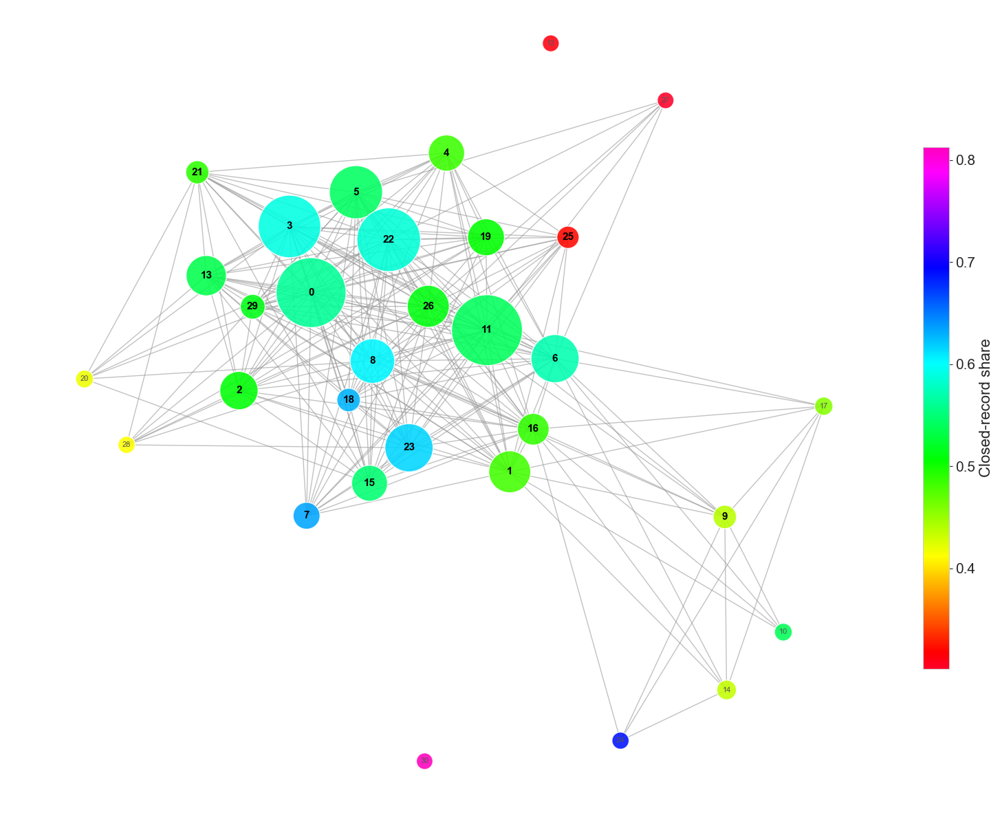

(<pyballmapper.ballmapper.BallMapper at 0x2322e22eeb0>,
 {0: array([-0.92334781,  0.61501633]),
  1: array([ 0.51689604, -0.76714749]),
  2: array([-1.44608695, -0.14068679]),
  3: array([-1.07957494,  1.12528814]),
  4: array([0.05851215, 1.69162822]),
  5: array([-0.59792628,  1.3893414 ]),
  6: array([0.84532053, 0.10567353]),
  7: array([-0.95595366, -1.10636477]),
  8: array([-0.47859331,  0.08703234]),
  9: array([ 2.07586656, -1.11532251]),
  10: array([ 2.50015667, -2.00389312]),
  11: array([0.35201582, 0.32521581]),
  12: array([0.81452136, 2.53802591]),
  13: array([-1.6830192 ,  0.74578082]),
  14: array([ 2.0888176 , -2.45038975]),
  15: array([-0.49922426, -0.8555259 ]),
  16: array([ 0.68736907, -0.43889951]),
  17: array([ 2.79316647, -0.26120156]),
  18: array([-0.65123925, -0.21353454]),
  19: array([0.34489216, 1.04178703]),
  20: array([-2.56566354, -0.05115342]),
  21: array([-1.7476985 ,  1.54323798]),
  22: array([-0.36037284,  1.02313919]),
  23: array([-0.21343

In [17]:
# Select the radius after inspecting the scan.
EPS_EXPANDED_MANUAL = 9.6

expanded_choice = expanded_eps_df.loc[np.isclose(expanded_eps_df["eps"], EPS_EXPANDED_MANUAL)]
if expanded_choice.empty:
    raise ValueError("EPS_EXPANDED_MANUAL must be inside EXPANDED_EPS_MIN--EXPANDED_EPS_MAX in steps of 0.1.")
display(expanded_choice)
print("Selected comparison: 31 expanded-variable balls versus 27 main balls (+14.8%).")
if not bool(expanded_choice["within_main_20pct"].iloc[0]):
    raise ValueError("Choose an expanded-variable epsilon whose ball count is within +/-20% of the main graph.")

expanded_bm = build_pbm(X_expanded, EPS_EXPANDED_MANUAL)
expanded_pos = nx.spring_layout(expanded_bm.Graph, k=1.5, scale=3.0, seed=SEED)
draw_pbm_custom(
    bm_df, X_expanded, EPS_EXPANDED_MANUAL, SPLIT_VAR,
    colorbar_label="Closed-record share",
    filename="bank_tdabm_expanded_variables_outcome.png",
    pos=expanded_pos, bm=expanded_bm,
)


## Landmark Order Robust Check

**Inputs:** `X`, `bm_df`, `SPLIT_VAR`, membership helpers and `SEED`. Runtime is dominated by the repeated graph constructions.

**Steps:**

1. Set 10,000 repetitions for each of 31 radii and make a positional lookup of the observed binary outcome.
2. For each radius and repetition, use seed `SEED + rep` to permute candidate landmarks and rebuild Ball Mapper.
3. Join memberships to outcomes and compute each ball’s membership size and outcome mean.
4. Classify means strictly greater than 0.50 as closed branch-majority. Means less than or equal to 0.50 join the open branch comparison group, including ties.
5. Record graph counts, numbers of balls in both outcome groups and the unweighted mean membership size within each group.
6. After all runs finish, write the raw simulation table.

**Outputs:** `bank_majority_50_results` and `bank_tdabm_majority_50_raw.csv`: 310,000 rows if all 31×10,000 runs complete.

In [18]:
N_LANDMARK_REPS = 10000
landmark_eps = np.unique(np.round(np.arange(5.5, 8.5 + 0.001, 0.1), 3))
MAJORITY_THRESHOLD = 0.50
LANDMARK_COL_POS, LANDMARK_COL_POS_CI = "#7b3294", "#c2a5cf"
LANDMARK_COL_NEG, LANDMARK_COL_NEG_CI = "#008837", "#a6dba0"

majority_records = []
majority_outcome_lookup = pd.DataFrame({
    "point": np.arange(len(bm_df), dtype=int),
    "outcome": get_numeric_series(bm_df, SPLIT_VAR).to_numpy(),
})

for eps in landmark_eps:
    for rep in range(N_LANDMARK_REPS):
        landmark_seed = SEED + rep
        landmark_order = np.random.default_rng(landmark_seed).permutation(len(X)).tolist()
        bm_seed = pbm.BallMapper(X=X, eps=float(eps), order=landmark_order)
        membership_seed = points_and_balls_df(bm_seed)
        ball_seed = (
            membership_seed
            .merge(majority_outcome_lookup, on="point", how="left", validate="many_to_one")
            .groupby("ball", sort=True)
            .agg(membership=("point", "size"), outcome_mean=("outcome", "mean"))
        )

        positive_balls = ball_seed.loc[ball_seed["outcome_mean"] > MAJORITY_THRESHOLD]
        comparison_balls = ball_seed.loc[ball_seed["outcome_mean"] <= MAJORITY_THRESHOLD]
        majority_records.append({
            "eps": float(eps),
            "rep": rep,
            "seed": landmark_seed,
            "threshold": MAJORITY_THRESHOLD,
            "n_balls": bm_seed.Graph.number_of_nodes(),
            "n_edges": bm_seed.Graph.number_of_edges(),
            "n_components": nx.number_connected_components(bm_seed.Graph),
            "n_majority": len(positive_balls),
            "n_majority_comparison": len(comparison_balls),
            "sz_majority": positive_balls["membership"].mean(),
            "sz_majority_comparison": comparison_balls["membership"].mean(),
        })
    print(f"eps={eps:.1f} completed")

bank_majority_50_results = pd.DataFrame(majority_records)
bank_majority_50_results.to_csv(
    TABLE_DIR / "bank_tdabm_majority_50_raw.csv", index=False
)
print("Positive outcome:", "closed branch")
print("Comparison outcome:", "open branch")


eps=5.5 completed
eps=5.6 completed
eps=5.7 completed
eps=5.8 completed
eps=5.9 completed
eps=6.0 completed
eps=6.1 completed
eps=6.2 completed
eps=6.3 completed
eps=6.4 completed
eps=6.5 completed
eps=6.6 completed
eps=6.7 completed
eps=6.8 completed
eps=6.9 completed
eps=7.0 completed
eps=7.1 completed
eps=7.2 completed
eps=7.3 completed
eps=7.4 completed
eps=7.5 completed
eps=7.6 completed
eps=7.7 completed
eps=7.8 completed
eps=7.9 completed
eps=8.0 completed
eps=8.1 completed
eps=8.2 completed
eps=8.3 completed
eps=8.4 completed
eps=8.5 completed
Positive outcome: closed branch
Comparison outcome: open branch


## Summary of Landmark robust check

**Inputs:** In-memory `bank_majority_50_results` from the preceding block.

**Steps:**

1. Use `functools.partial` to bind `np.nanpercentile` to q=2.5 and q=97.5, producing reusable aggregation callables.
2. Group by radius and compute the mean and empirical percentile bounds for positive/comparison ball counts and mean membership sizes.
3. Insert the majority threshold and export the percentile summary.
4. Draw counts in the upper panel and mean sizes in the lower panel, with separate mean curves, shaded intervals and the reported-radius reference line.

**Outputs:** `bank_tdabm_majority_50_percentile_summary.csv` and `bank_tdabm_majority_50_percentile_ranges.png`.

,eps,threshold,n_pos_mean,n_pos_lo,n_pos_hi,n_neg_mean,n_neg_lo,n_neg_hi,sz_pos_mean,sz_pos_lo,sz_pos_hi,sz_neg_mean,sz_neg_lo,sz_neg_hi
0,5.5,0.5,39.2728,34.0,45.0,26.4248,21.0,32.0,957.395096,797.665441,1130.495193,340.845309,234.224107,459.160464
1,5.6,0.5,38.8597,33.0,44.0,22.5162,18.0,27.0,982.328465,817.092228,1163.500000,366.286878,244.260746,500.435913
2,5.7,0.5,35.6082,30.0,41.0,22.4288,18.0,27.0,1068.476895,890.473936,1268.103248,370.718471,244.686222,508.203333
3,5.8,0.5,33.3240,28.0,38.0,21.1735,17.0,26.0,1139.292588,947.257674,1356.905179,381.958317,244.332692,534.574771
4,5.9,0.5,31.8843,27.0,37.0,19.2412,15.0,23.0,1184.463180,978.782200,1417.179167,421.037118,264.054167,595.501250
5,6.0,0.5,29.7963,25.0,35.0,18.2409,14.0,22.0,1254.825483,1031.840553,1504.113724,446.868177,274.198125,635.723214
6,6.1,0.5,28.4207,24.0,33.0,17.3613,13.0,21.0,1318.838719,1074.463885,1586.617000,459.481669,276.247596,663.215789
7,6.2,0.5,26.0883,21.0,31.0,17.0843,13.0,21.0,1425.381387,1143.268641,1740.528339,464.063306,272.495313,670.118653
8,6.3,0.5,24.3459,19.0,29.0,15.9645,12.0,20.0,1529.106967,1212.803804,1889.503289,478.647097,273.075000,701.091964
9,6.4,0.5,23.0767,18.0,28.0,15.2449,11.0,19.0,1607.306362,1263.928434,1993.502273,494.767263,277.707366,740.078333


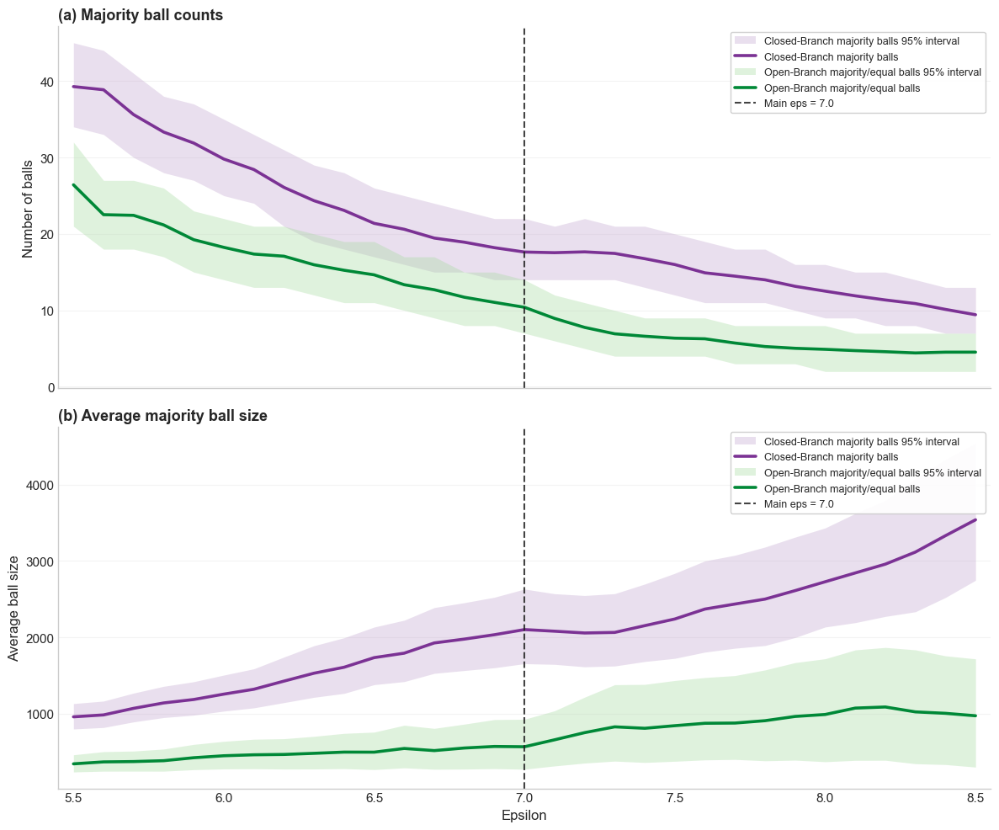

In [19]:
# Summarise the 50% majority-rule runs and plot empirical 95% seed intervals.
from functools import partial

q025_majority = partial(np.nanpercentile, q=2.5)
q975_majority = partial(np.nanpercentile, q=97.5)
bank_majority_50_ci = bank_majority_50_results.groupby("eps").agg(
    n_pos_mean=("n_majority", "mean"), n_pos_lo=("n_majority", q025_majority), n_pos_hi=("n_majority", q975_majority),
    n_neg_mean=("n_majority_comparison", "mean"), n_neg_lo=("n_majority_comparison", q025_majority), n_neg_hi=("n_majority_comparison", q975_majority),
    sz_pos_mean=("sz_majority", "mean"), sz_pos_lo=("sz_majority", q025_majority), sz_pos_hi=("sz_majority", q975_majority),
    sz_neg_mean=("sz_majority_comparison", "mean"), sz_neg_lo=("sz_majority_comparison", q025_majority), sz_neg_hi=("sz_majority_comparison", q975_majority),
).reset_index()
bank_majority_50_ci.insert(1, "threshold", MAJORITY_THRESHOLD)
bank_majority_50_ci.to_csv(
    TABLE_DIR / "bank_tdabm_majority_50_percentile_summary.csv", index=False
)
display(bank_majority_50_ci)

plt.style.use("seaborn-v0_8-whitegrid")
fig, axes = plt.subplots(2, 1, figsize=(12, 10), sharex=True)
fig.patch.set_facecolor("white")
eps_x = bank_majority_50_ci["eps"].to_numpy(dtype=float)

for ax, pos_prefix, neg_prefix, ylabel, subtitle in [
    (axes[0], "n_pos", "n_neg", "Number of balls", "(a) Majority ball counts"),
    (axes[1], "sz_pos", "sz_neg", "Average ball size", "(b) Average majority ball size"),
]:
    ax.fill_between(eps_x, bank_majority_50_ci[f"{pos_prefix}_lo"], bank_majority_50_ci[f"{pos_prefix}_hi"], color=LANDMARK_COL_POS_CI, alpha=0.35, linewidth=0, label="Closed-Branch majority balls 95% interval")
    ax.plot(eps_x, bank_majority_50_ci[f"{pos_prefix}_mean"], color=LANDMARK_COL_POS, linewidth=2.6, label="Closed-Branch majority balls")
    ax.fill_between(eps_x, bank_majority_50_ci[f"{neg_prefix}_lo"], bank_majority_50_ci[f"{neg_prefix}_hi"], color=LANDMARK_COL_NEG_CI, alpha=0.35, linewidth=0, label="Open-Branch majority/equal balls 95% interval")
    ax.plot(eps_x, bank_majority_50_ci[f"{neg_prefix}_mean"], color=LANDMARK_COL_NEG, linewidth=2.6, label="Open-Branch majority/equal balls")
    ax.axvline(EPS_MAIN, color="#222222", linestyle="--", linewidth=1.5, alpha=0.85, label=f"Main eps = {EPS_MAIN}")
    ax.set_ylabel(ylabel, fontsize=12)
    ax.set_title(subtitle, loc="left", fontsize=13, fontweight="bold")
    ax.grid(True, axis="y", alpha=0.22)
    ax.grid(False, axis="x")
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.tick_params(axis="both", labelsize=11)

axes[1].set_xlabel("Epsilon", fontsize=12)
axes[1].set_xticks([5.5, 6.0, 6.5, 7.0, 7.5, 8.0, 8.5])
axes[1].set_xlim(5.45, 8.55)
axes[0].legend(fontsize=9, loc="upper right", frameon=True, framealpha=0.92)
axes[1].legend(fontsize=9, loc="upper right", frameon=True, framealpha=0.92)
plt.tight_layout()
plt.savefig(FIG_DIR / "bank_tdabm_majority_50_percentile_ranges.png", dpi=180, bbox_inches="tight", facecolor="white")
plt.show()
